In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import re
import math
import os
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from pandas.plotting import parallel_coordinates
import ast
from decimal import Decimal

sns.set(style="whitegrid")

In [10]:
df_conn = pd.read_csv('../024/connections.csv', sep='\t')
df_dev = pd.read_csv('../024/devices.csv', sep='\t')
df_proc = pd.read_csv('../024/processes.csv', sep='\t')
df_prof = pd.read_csv('../024/profiles.csv', on_bad_lines='skip', sep='\t')
if df_conn.empty or df_dev.empty or df_proc.empty or df_prof.empty:
    print('Data is empty!')
else:
    print('Data loaded successfully!')
    datasets = {
        'Connections': df_conn,
        'Devices': df_dev,
        'Processes': df_proc,
        'Profiles': df_prof
    }


Data loaded successfully!


**Základný opis dát spolu s ich charakteristikami**

1.1 A:

In [11]:
def A1b(x):
    name, df = list(datasets.items())[x]
    print(f'"{name}" dataset has {df.shape[0]} rows and {df.shape[1]} columns')
    
    print("\nDataFrame info:")
    df.info()
    
    print("\nDataFrame describe:")
    print(df.describe())
    
    missing_values = df.isnull().sum()
    print("\nMissing data in attributes:")
    print(missing_values[missing_values > 0])

In [12]:
A1b(0)

"Connections" dataset has 15061 rows and 13 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15061 entries, 0 to 15060
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ts                 15061 non-null  object 
 1   imei               15061 non-null  int64  
 2   mwra               15061 non-null  float64
 3   c.android.youtube  15061 non-null  float64
 4   c.dogalize         15061 non-null  float64
 5   c.android.gm       15061 non-null  float64
 6   c.katana           15061 non-null  float64
 7   c.android.chrome   15061 non-null  float64
 8   c.updateassist     15061 non-null  float64
 9   c.raider           15061 non-null  float64
 10  c.android.vending  15061 non-null  float64
 11  c.UCMobile.x86     15061 non-null  float64
 12  c.UCMobile.intl    15061 non-null  float64
dtypes: float64(11), int64(1), object(1)
memory usage: 1.5+ MB

DataFrame describe:
               ime

In [13]:
A1b(1)

"Devices" dataset has 2882 rows and 6 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2882 entries, 0 to 2881
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   latitude    2882 non-null   float64
 1   longitude   2882 non-null   float64
 2   store_name  2882 non-null   object 
 3   code        2878 non-null   object 
 4   location    2882 non-null   object 
 5   imei        2882 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 135.2+ KB

DataFrame describe:
         latitude    longitude          imei
count  2882.00000  2882.000000  2.882000e+03
mean     29.26384     8.685782  3.929463e+18
std      23.55665    71.906965  3.322250e+18
min     -54.80000  -156.474320  3.590434e+17
25%      15.48131   -60.931730  8.630331e+17
50%      36.76639     9.575600  3.590434e+18
75%      47.30997    68.117590  8.630331e+18
max      68.79833   178.004170  8.630331e+18

Missing data

In [14]:
A1b(2)

"Processes" dataset has 15061 rows and 23 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15061 entries, 0 to 15060
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ts                          15061 non-null  object 
 1   imei                        15061 non-null  int64  
 2   mwra                        15061 non-null  float64
 3   p.android.chrome            15061 non-null  float64
 4   p.android.settings          15061 non-null  float64
 5   p.android.documentsui       15061 non-null  float64
 6   p.system                    15061 non-null  float64
 7   p.android.externalstorage   15061 non-null  float64
 8   p.android.packageinstaller  15061 non-null  float64
 9   p.android.gm                15061 non-null  float64
 10  p.dogalize                  15061 non-null  float64
 11  p.olauncher                 15061 non-null  float64
 12  p.process.gapps      

In [15]:
A1b(3)

"Profiles" dataset has 2618 rows and 12 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2618 entries, 0 to 2617
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   registration      2618 non-null   object
 1   birthdate         1440 non-null   object
 2   current_location  2487 non-null   object
 3   company           2618 non-null   object
 4   ssn               2618 non-null   object
 5   residence         916 non-null    object
 6   imei              2618 non-null   int64 
 7   user_id           2618 non-null   int64 
 8   name              2618 non-null   object
 9   username          2618 non-null   object
 10  mail              2618 non-null   object
 11  job               785 non-null    object
dtypes: int64(2), object(10)
memory usage: 245.6+ KB

DataFrame describe:
               imei      user_id
count  2.618000e+03  2618.000000
mean   3.914570e+18  1294.042017
std    3.34

1.1 B:

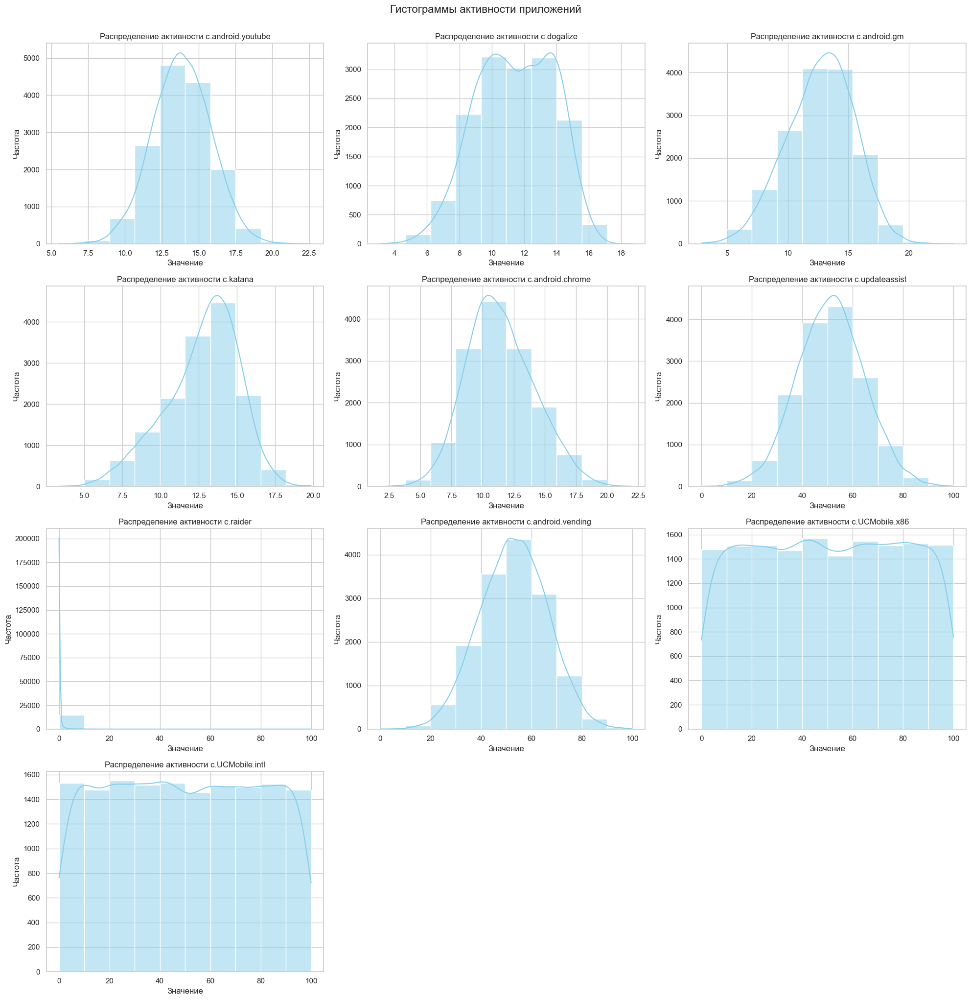

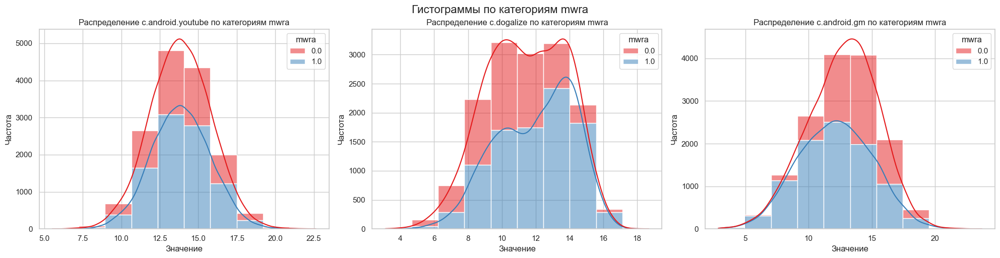

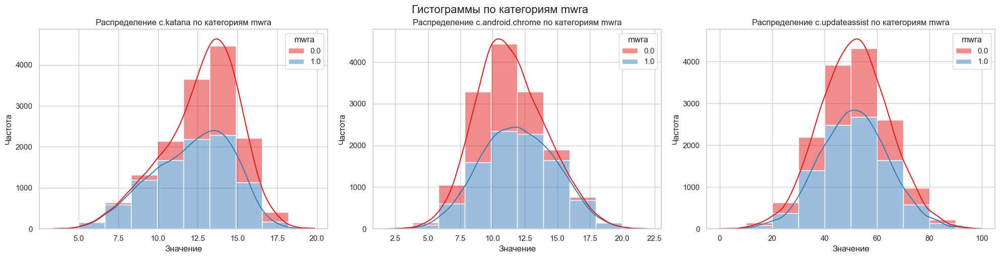

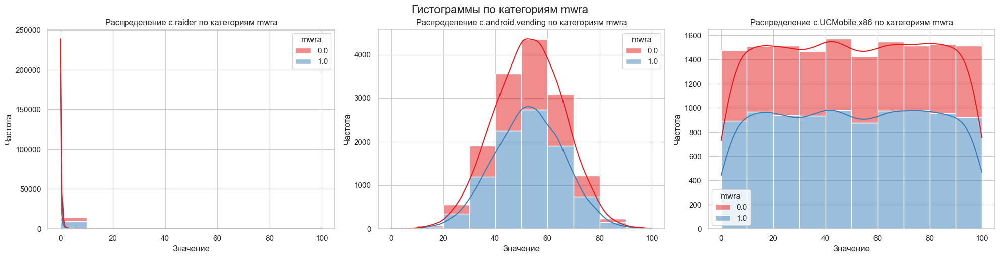

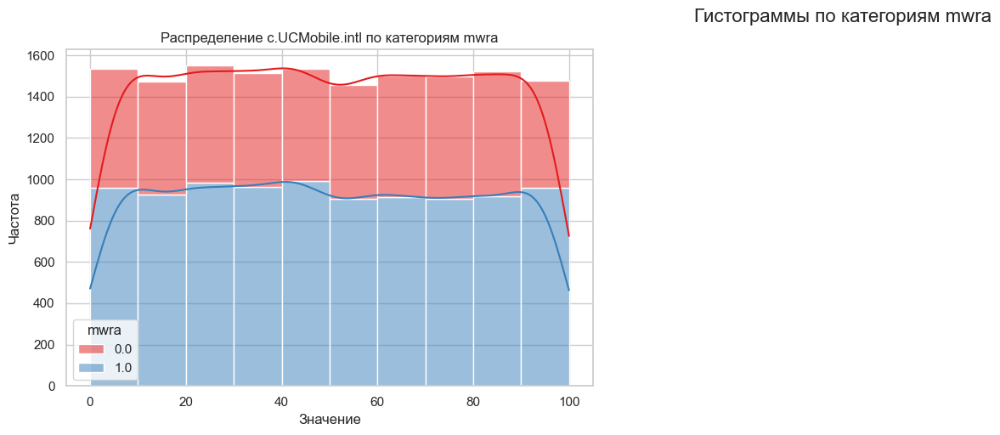

...

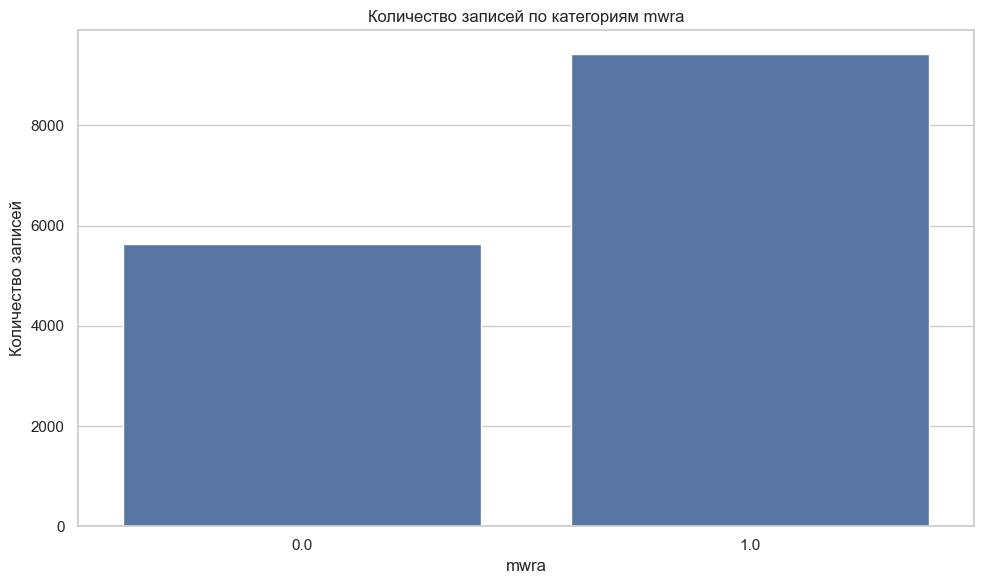

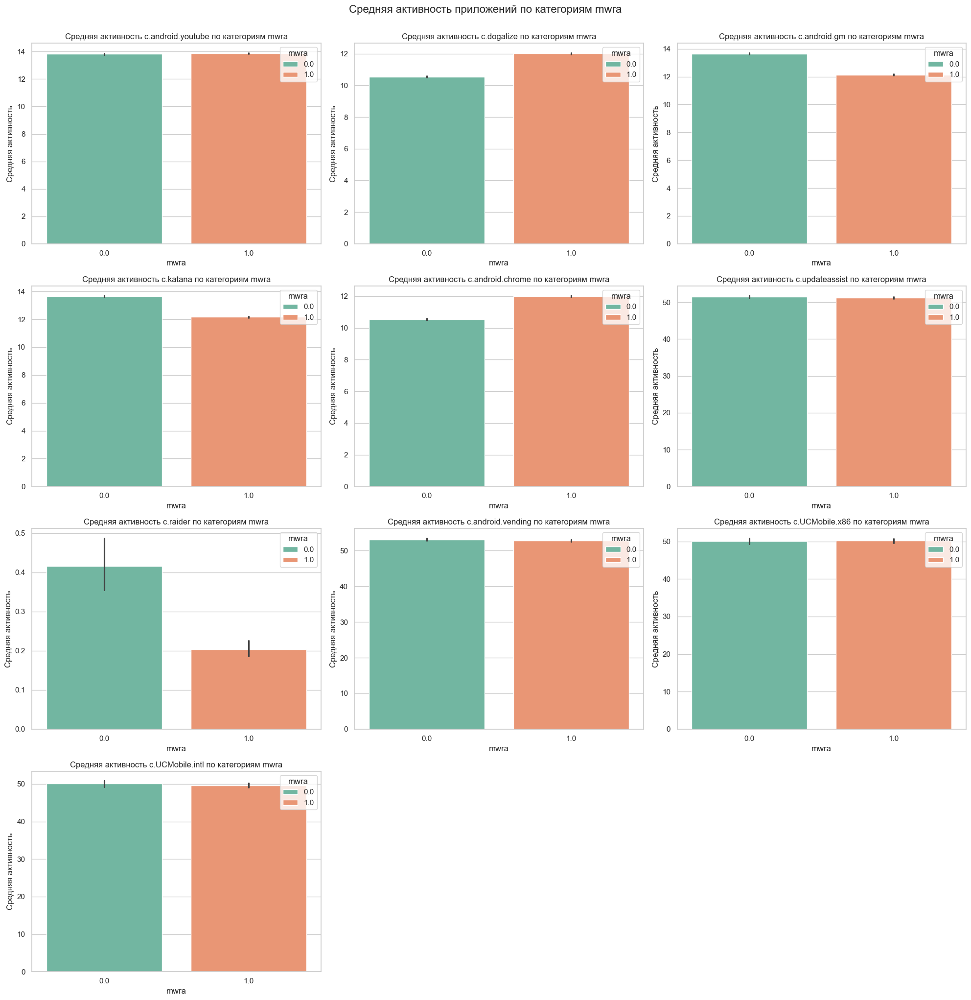

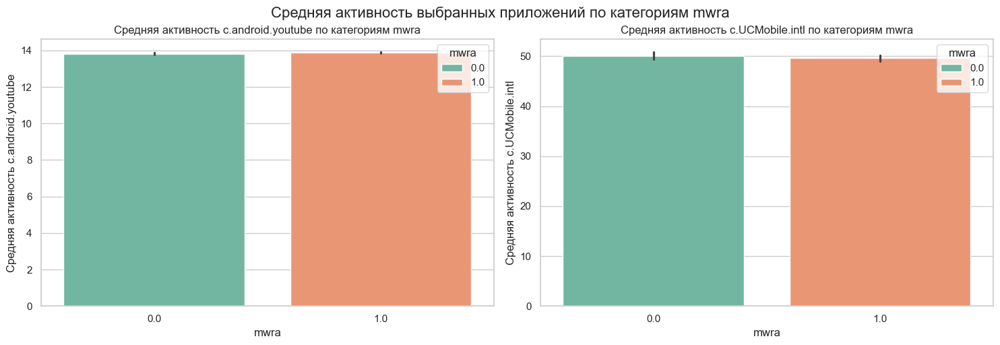

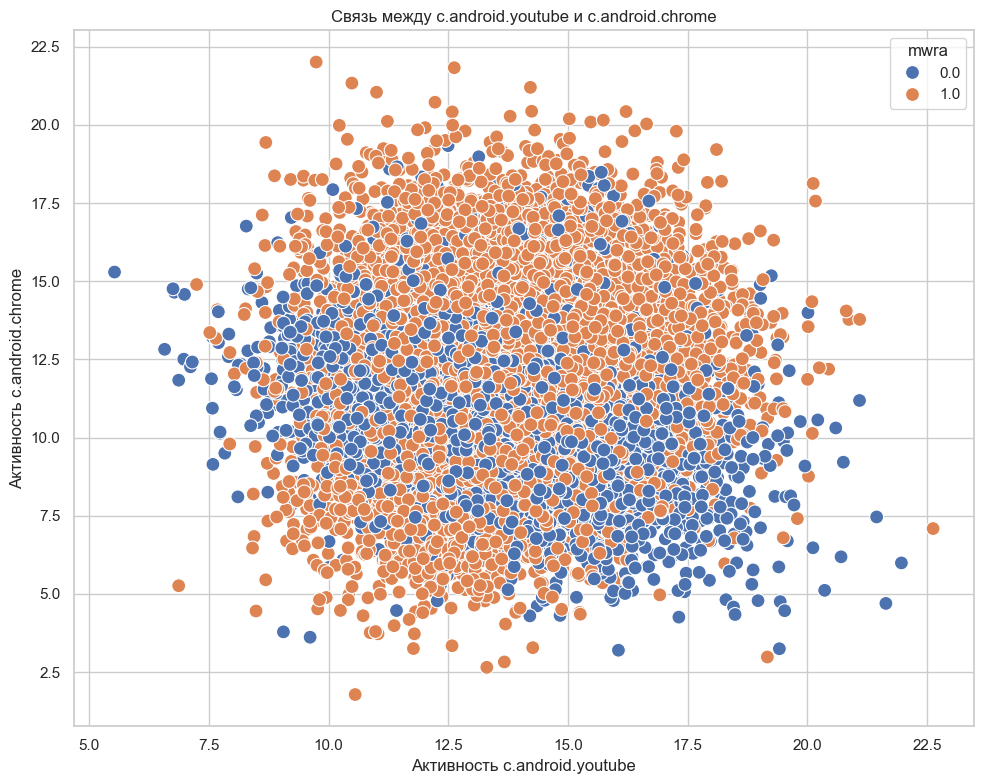

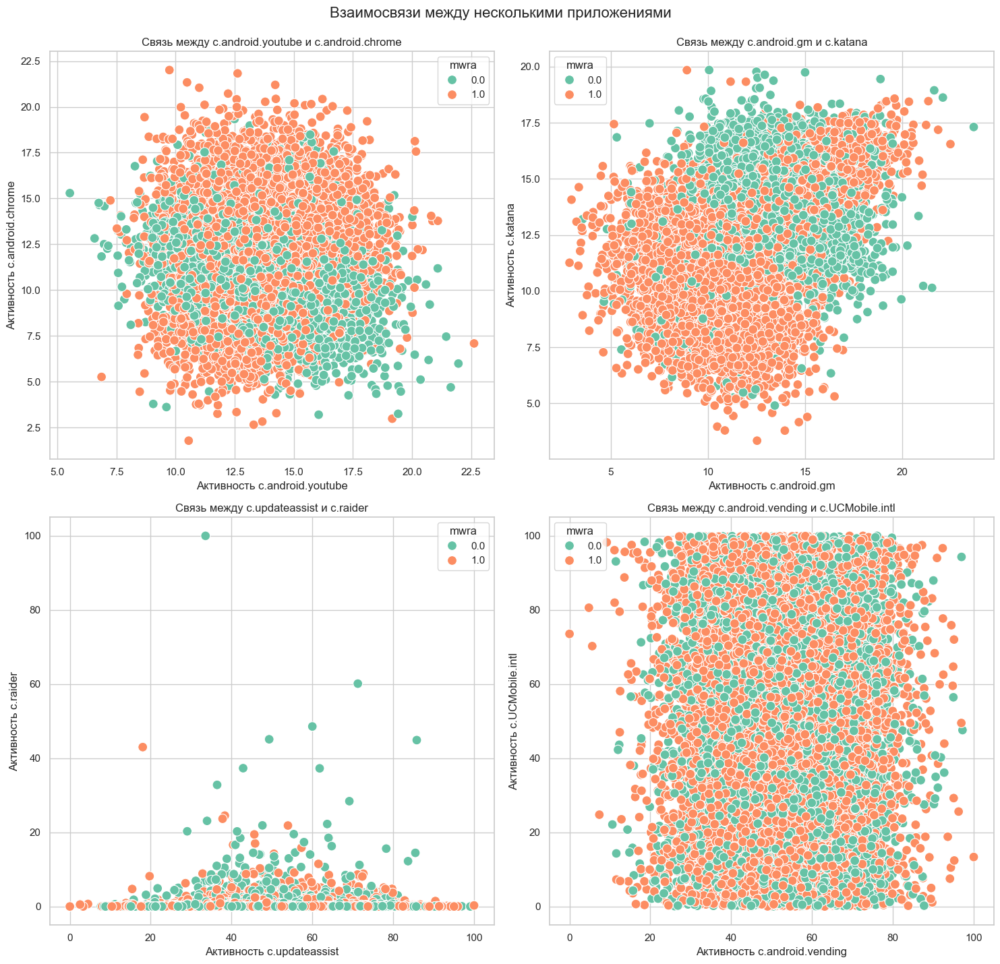

In [16]:

def analyze_connections(df):
    apps = [
        'c.android.youtube', 'c.dogalize', 'c.android.gm', 'c.katana', 
        'c.android.chrome', 'c.updateassist', 'c.raider', 
        'c.android.vending', 'c.UCMobile.x86', 'c.UCMobile.intl'
    ]
    for app in apps:
        if app not in df.columns:
            print(f"Колонка '{app}' отсутствует в DataFrame.")
            continue  # пропускаем итерацию, если колонки нет

    
    selected_apps = ['c.android.youtube', 'c.UCMobile.intl']
    
    # 1. Гистограммы (Histogram) - группируем в одну фигуру
    num_apps = len(apps)
    cols = 3
    rows = math.ceil(num_apps / cols)
    
    fig_hist, axes_hist = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes_hist = axes_hist.flatten()
    
    for i, app in enumerate(apps):
        sns.histplot(df[app], bins=10, kde=True, color='skyblue', ax=axes_hist[i])
        axes_hist[i].set_title(f'Распределение активности {app}')
        axes_hist[i].set_xlabel('Значение')
        axes_hist[i].set_ylabel('Частота')
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_apps, len(axes_hist)):
        fig_hist.delaxes(axes_hist[j])
    
    fig_hist.tight_layout()
    fig_hist.suptitle('Гистограммы активности приложений', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_hist)
    
    # 2. Гистограммы по категориям mwra - группируем в несколько фигур по 3 графика
    apps_per_fig = 3
    for start in range(0, len(apps), apps_per_fig):
        subset_apps = apps[start:start + apps_per_fig]
        num_subset = len(subset_apps)
        cols_subset = 3
        rows_subset = math.ceil(num_subset / cols_subset)
        
        fig_hist_mwra, axes_hist_mwra = plt.subplots(rows_subset, cols_subset, figsize=(20, 5 * rows_subset))
        axes_hist_mwra = axes_hist_mwra.flatten()
        
        for i, app in enumerate(subset_apps):
            sns.histplot(
                data=df, x=app, bins=10, kde=True, palette='Set1', multiple='stack', ax=axes_hist_mwra[i], hue='mwra'
            )
            axes_hist_mwra[i].set_title(f'Распределение {app} по категориям mwra')
            axes_hist_mwra[i].set_xlabel('Значение')
            axes_hist_mwra[i].set_ylabel('Частота')
            handles, labels = axes_hist_mwra[i].get_legend_handles_labels()
            if handles:
                axes_hist_mwra[i].legend(title='mwra')
        
        # Удаляем пустые подграфики, если есть
        for j in range(num_subset, len(axes_hist_mwra)):
            fig_hist_mwra.delaxes(axes_hist_mwra[j])
        
        fig_hist_mwra.tight_layout()
        fig_hist_mwra.suptitle('Гистограммы по категориям mwra', fontsize=16, y=1.02)
        plt.show()
        plt.close(fig_hist_mwra)
    
    # 3. Коробчатые диаграммы (Boxplot) - группируем в одну фигуру
    num_box_apps = len(apps)
    cols_box = 3
    rows_box = math.ceil(num_box_apps / cols_box)
    
    fig_box, axes_box = plt.subplots(rows_box, cols_box, figsize=(20, 5 * rows_box))
    axes_box = axes_box.flatten()
    
    for i, app in enumerate(apps):
        sns.boxplot(
            x='mwra', y=app, data=df, palette='Set2', dodge=False, ax=axes_box[i], hue='mwra'
        )
        axes_box[i].set_title(f'Распределение {app} по категориям mwra')
        axes_box[i].set_xlabel('mwra')
        axes_box[i].set_ylabel('Активность')
        axes_box[i].legend([], [], frameon=False)  # Убираем легенду для чистоты графика
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_box_apps, len(axes_box)):
        fig_box.delaxes(axes_box[j])
    
    fig_box.tight_layout()
    fig_box.suptitle('Коробчатые диаграммы активности приложений', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_box)
    
    # 4. Коробчатые диаграммы для выбранных приложений - группируем в одну фигуру
    num_selected = len(selected_apps)
    cols_sel_box = 2
    rows_sel_box = math.ceil(num_selected / cols_sel_box)
    
    fig_box_sel, axes_box_sel = plt.subplots(rows_sel_box, cols_sel_box, figsize=(15, 5 * rows_sel_box))
    axes_box_sel = axes_box_sel.flatten()
    
    for i, app in enumerate(selected_apps):
        sns.boxplot(
            x='mwra', y=app, data=df, palette='Set2', dodge=False, ax=axes_box_sel[i], hue='mwra'
        )
        axes_box_sel[i].set_title(f'Распределение {app} по категориям mwra')
        axes_box_sel[i].set_xlabel('mwra')
        axes_box_sel[i].set_ylabel(f'Активность {app}')
        axes_box_sel[i].legend([], [], frameon=False)  # Убираем легенду
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_selected, len(axes_box_sel)):
        fig_box_sel.delaxes(axes_box_sel[j])
    
    fig_box_sel.tight_layout()
    fig_box_sel.suptitle('Коробчатые диаграммы для выбранных приложений', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_box_sel)
    
    # 5. Столбчатые графики подсчёта (Countplot) - отдельная фигура
    fig_count, ax_count = plt.subplots(figsize=(10, 6))
    sns.countplot(x='mwra', data=df, ax=ax_count)
    ax_count.set_title('Количество записей по категориям mwra')
    ax_count.set_xlabel('mwra')
    ax_count.set_ylabel('Количество записей')
    fig_count.tight_layout()
    plt.show()
    plt.close(fig_count)
    
    # 6. Столбчатые графики сравнения (Barplot) - группируем в одну фигуру
    num_bar_apps = len(apps)
    cols_bar = 3
    rows_bar = math.ceil(num_bar_apps / cols_bar)
    
    fig_bar, axes_bar = plt.subplots(rows_bar, cols_bar, figsize=(20, 5 * rows_bar))
    axes_bar = axes_bar.flatten()
    
    for i, app in enumerate(apps):
        sns.barplot(x='mwra', y=app, data=df, ax=axes_bar[i], palette='Set2', hue='mwra')
        axes_bar[i].set_title(f'Средняя активность {app} по категориям mwra')
        axes_bar[i].set_xlabel('mwra')
        axes_bar[i].set_ylabel('Средняя активность')
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_bar_apps, len(axes_bar)):
        fig_bar.delaxes(axes_bar[j])
    
    fig_bar.tight_layout()
    fig_bar.suptitle('Средняя активность приложений по категориям mwra', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_bar)
    
    # 7. Столбчатые графики сравнения для выбранных приложений - группируем в одну фигуру
    num_sel_bar = len(selected_apps)
    cols_sel_bar = 2
    rows_sel_bar = math.ceil(num_sel_bar / cols_sel_bar)
    
    fig_bar_sel, axes_bar_sel = plt.subplots(rows_sel_bar, cols_sel_bar, figsize=(15, 5 * rows_sel_bar))
    axes_bar_sel = axes_bar_sel.flatten()
    
    for i, app in enumerate(selected_apps):
        sns.barplot(x='mwra', y=app, data=df, ax=axes_bar_sel[i], palette='Set2', hue='mwra')
        axes_bar_sel[i].set_title(f'Средняя активность {app} по категориям mwra')
        axes_bar_sel[i].set_xlabel('mwra')
        axes_bar_sel[i].set_ylabel(f'Средняя активность {app}')
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_sel_bar, len(axes_bar_sel)):
        fig_bar_sel.delaxes(axes_bar_sel[j])
    
    fig_bar_sel.tight_layout()
    fig_bar_sel.suptitle('Средняя активность выбранных приложений по категориям mwra', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_bar_sel)
    
    # 8. Точечные диаграммы (Scatterplot) - отдельная фигура
    fig_scatter, ax_scatter = plt.subplots(figsize=(10, 8))
    sns.scatterplot(
        x='c.android.youtube', y='c.android.chrome', hue="mwra", data=df, palette='deep', s=100, ax=ax_scatter
    )
    ax_scatter.set_title('Связь между c.android.youtube и c.android.chrome')
    ax_scatter.set_xlabel('Активность c.android.youtube')
    ax_scatter.set_ylabel('Активность c.android.chrome')
    fig_scatter.tight_layout()
    plt.show()
    plt.close(fig_scatter)
    

    # 10. Взаимосвязи между несколькими приложениями - группируем в одну фигуру
    pairs = [
        ('c.android.youtube', 'c.android.chrome'),
        ('c.android.gm', 'c.katana'),
        ('c.updateassist', 'c.raider'),
        ('c.android.vending', 'c.UCMobile.intl')
    ]
    
    num_pairs = len(pairs)
    cols_pairs = 2
    rows_pairs = math.ceil(num_pairs / cols_pairs)
    
    fig_scatter_pairs, axes_scatter_pairs = plt.subplots(rows_pairs, cols_pairs, figsize=(15, 7 * rows_pairs))
    axes_scatter_pairs = axes_scatter_pairs.flatten()
    
    for i, (x_var, y_var) in enumerate(pairs):
        sns.scatterplot(
            x=x_var, y=y_var, hue="mwra", data=df, palette='Set2', s=100, ax=axes_scatter_pairs[i]
        )
        axes_scatter_pairs[i].set_title(f'Связь между {x_var} и {y_var}')
        axes_scatter_pairs[i].set_xlabel(f'Активность {x_var}')
        axes_scatter_pairs[i].set_ylabel(f'Активность {y_var}')
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_pairs, len(axes_scatter_pairs)):
        fig_scatter_pairs.delaxes(axes_scatter_pairs[j])
    
    fig_scatter_pairs.tight_layout()
    fig_scatter_pairs.suptitle('Взаимосвязи между несколькими приложениями', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_scatter_pairs)
    
analyze_connections(df_conn)

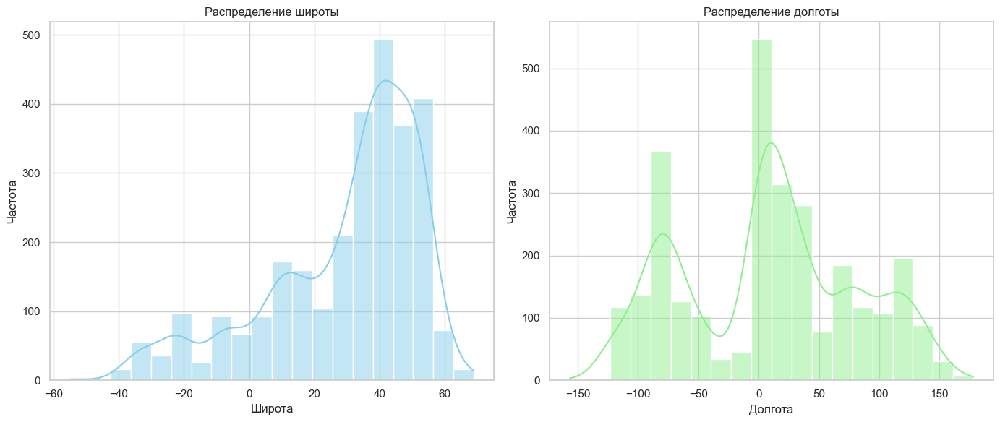

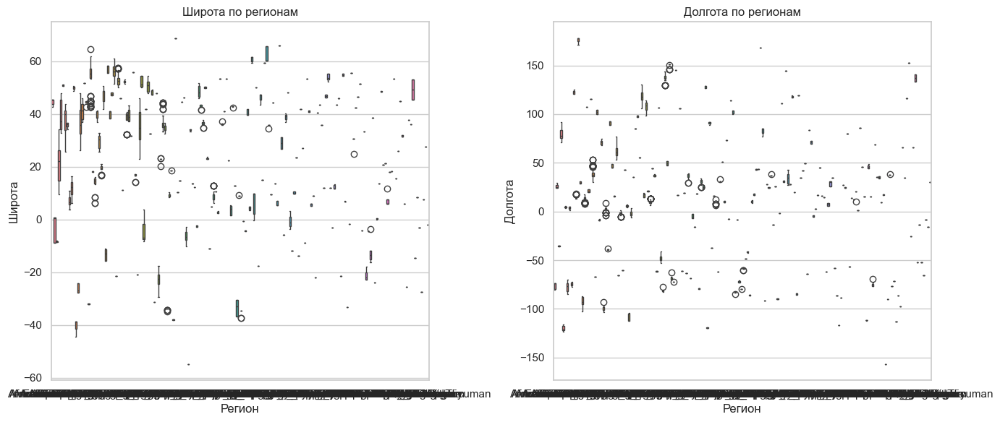

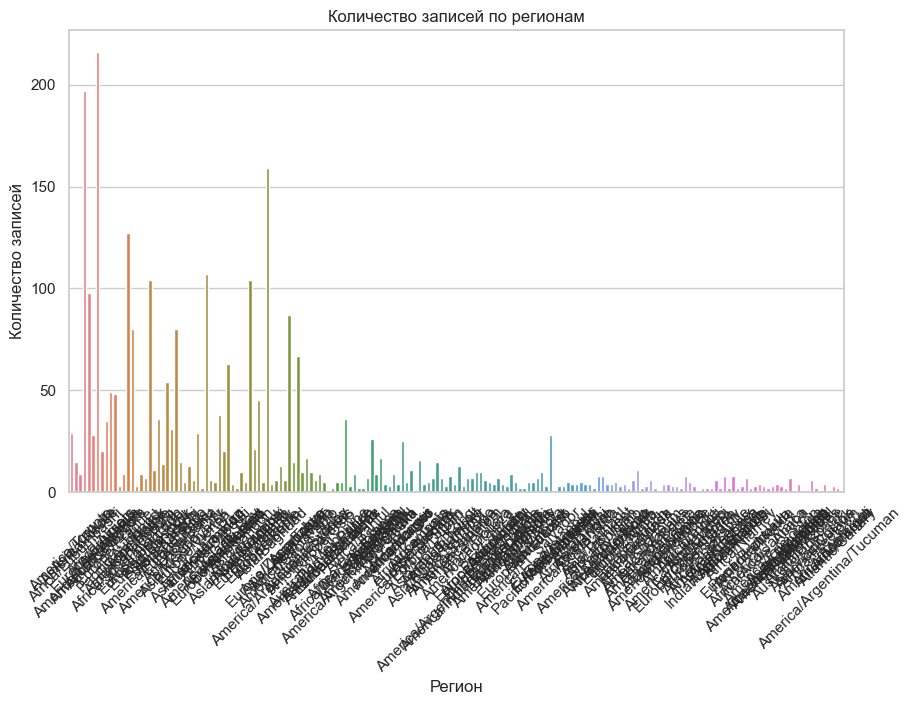

In [17]:
def analyze_devices(df):
   # 1. Гистограммы для широты и долготы
    plt.figure(figsize=(14, 6))

    # Histogram for Latitude
    plt.subplot(1, 2, 1)
    sns.histplot(df['latitude'], bins=20, kde=True, color='skyblue')
    plt.title('Распределение широты')
    plt.xlabel('Широта')
    plt.ylabel('Частота')

    # Histogram for Longitude
    plt.subplot(1, 2, 2)
    sns.histplot(df['longitude'], bins=20, kde=True, color='lightgreen')
    plt.title('Распределение долготы')
    plt.xlabel('Долгота')
    plt.ylabel('Частота')

    plt.tight_layout()
    plt.show()

    # 2. Коробчатые диаграммы для широты и долготы по регионам
    plt.figure(figsize=(14, 6))
    
    # Boxplot for Latitude by Region
    plt.subplot(1, 2, 1)
    sns.boxplot(x='location', y='latitude', data=df, hue='location', dodge=False)
    plt.title('Широта по регионам')
    plt.xlabel('Регион')
    plt.ylabel('Широта')
    plt.legend([], [], frameon=False)  # Убираем легенду для чистоты графика

    # Boxplot for Longitude by Region
    plt.subplot(1, 2, 2)
    sns.boxplot(x='location', y='longitude', data=df, hue='location', dodge=False)
    plt.title('Долгота по регионам')
    plt.xlabel('Регион')
    plt.ylabel('Долгота')
    plt.legend([], [], frameon=False)  # Убираем легенду для чистоты графика

    plt.tight_layout()
    plt.show()

    # 4. Столбчатые графики подсчёта количества записей по регионам
    plt.figure(figsize=(10, 6))
    sns.countplot(x='location', data=df, hue='location')  # Assigning hue to use the default palette
    plt.title('Количество записей по регионам')
    plt.xlabel('Регион')
    plt.ylabel('Количество записей')
    plt.xticks(rotation=45)
    plt.show()

analyze_devices(df_dev)

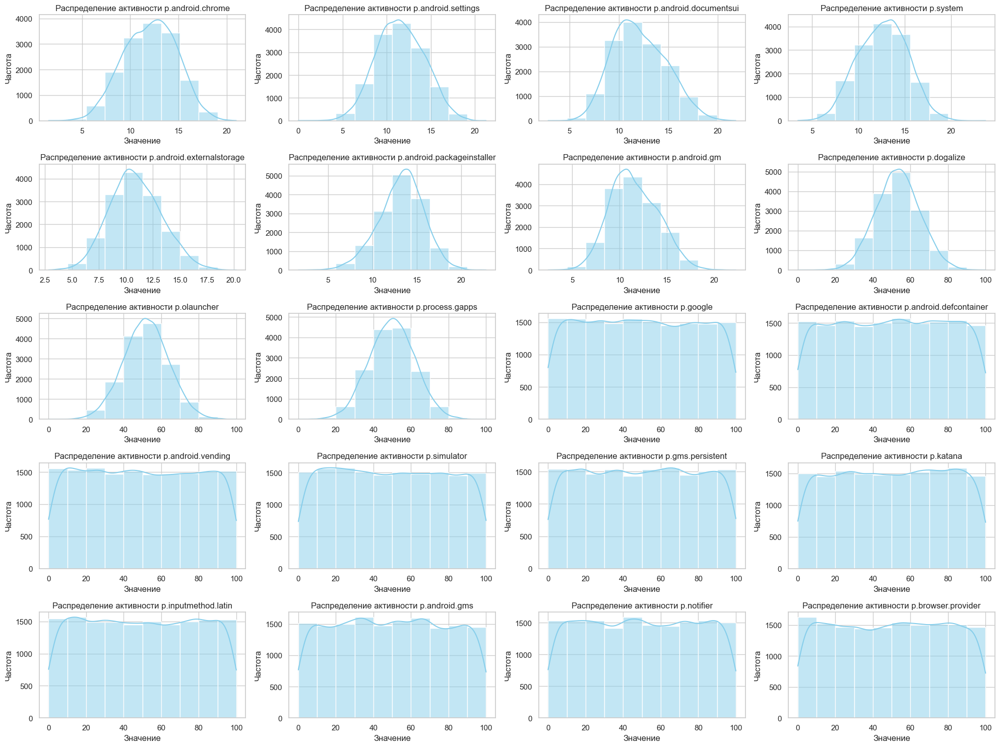

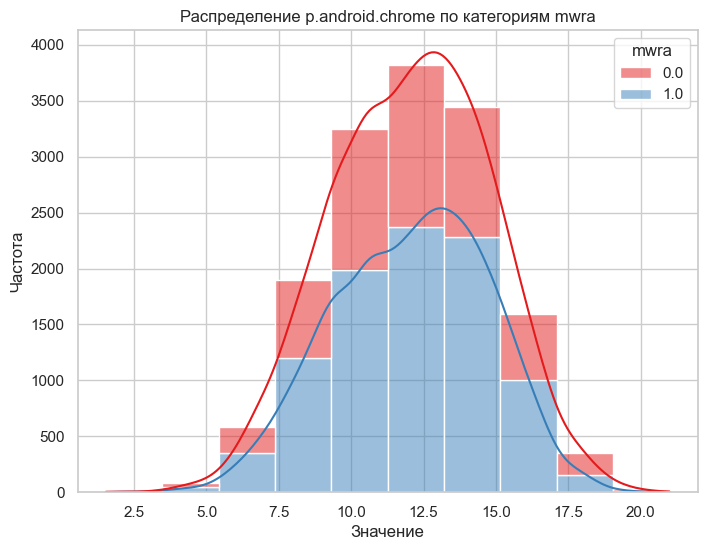

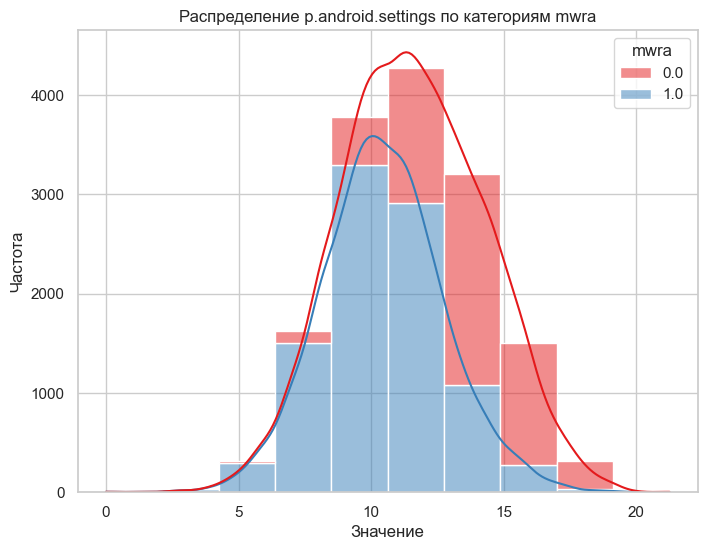

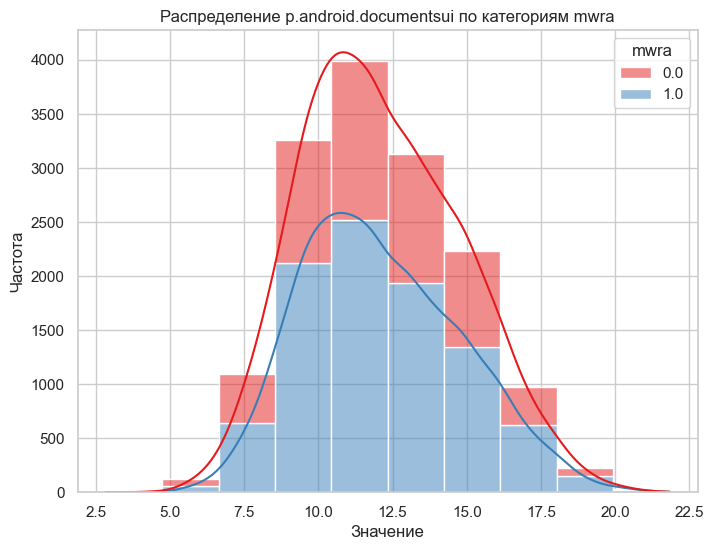

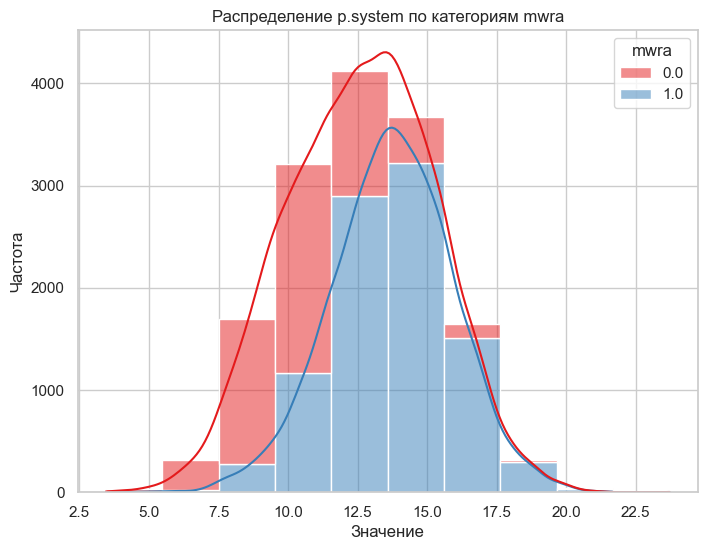

...

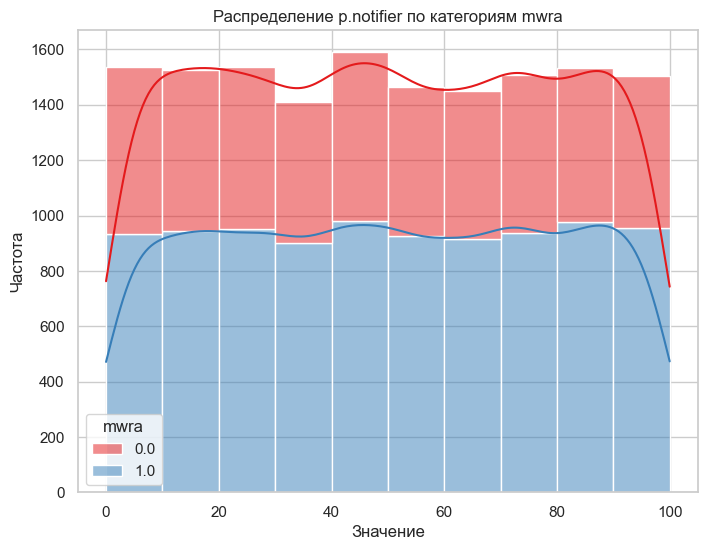

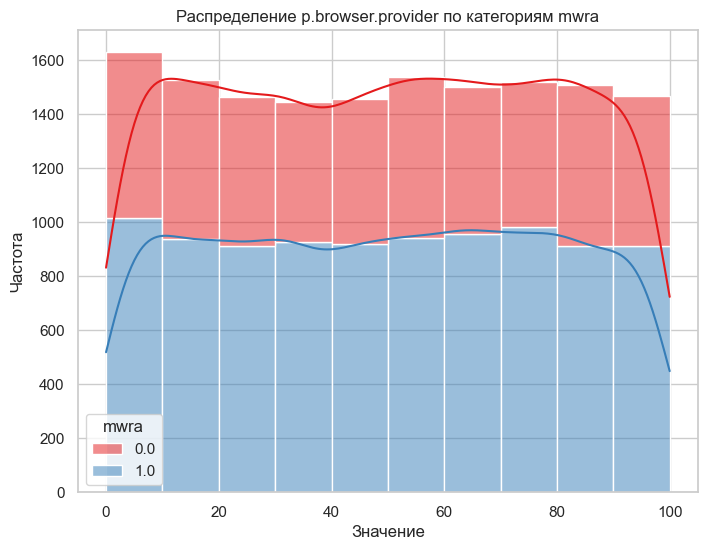

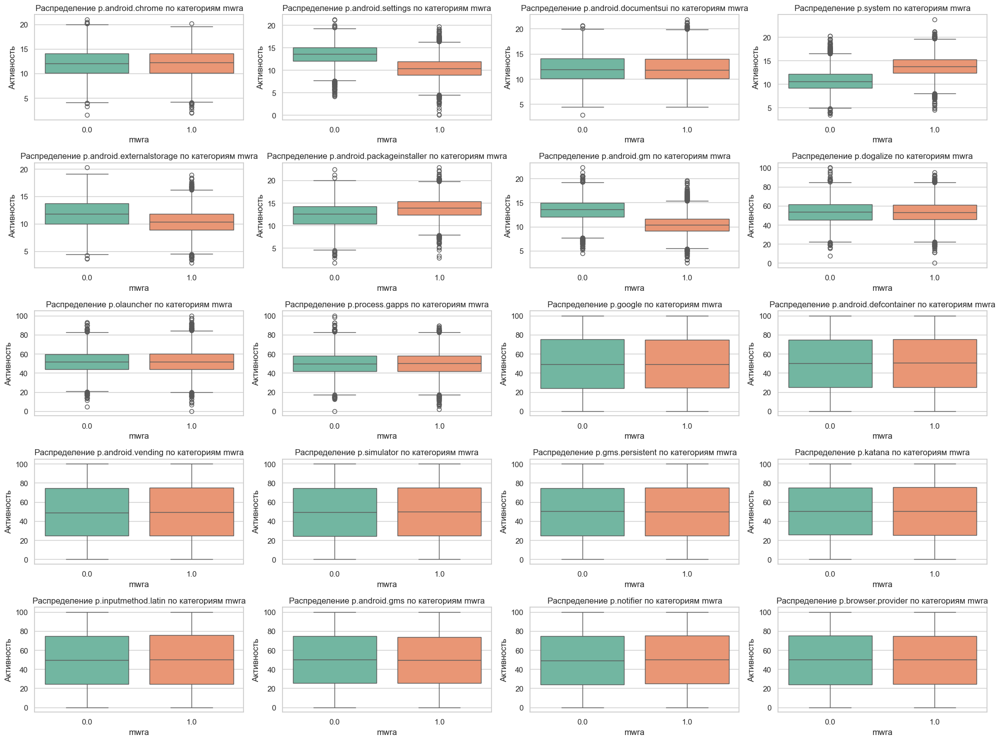

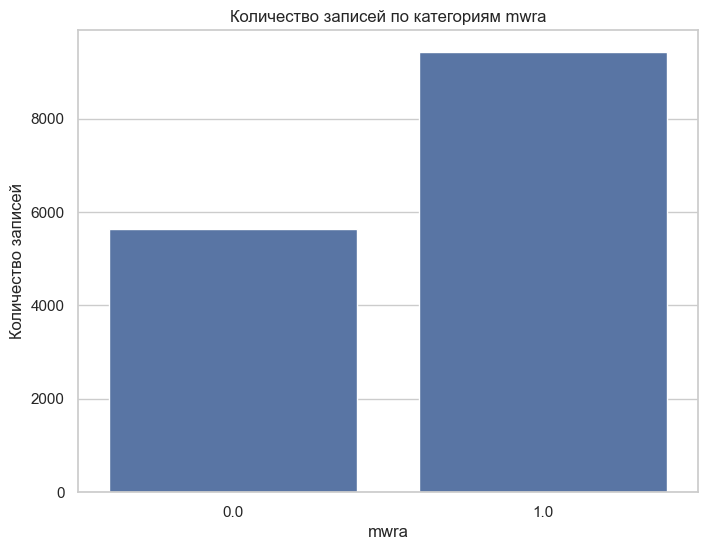

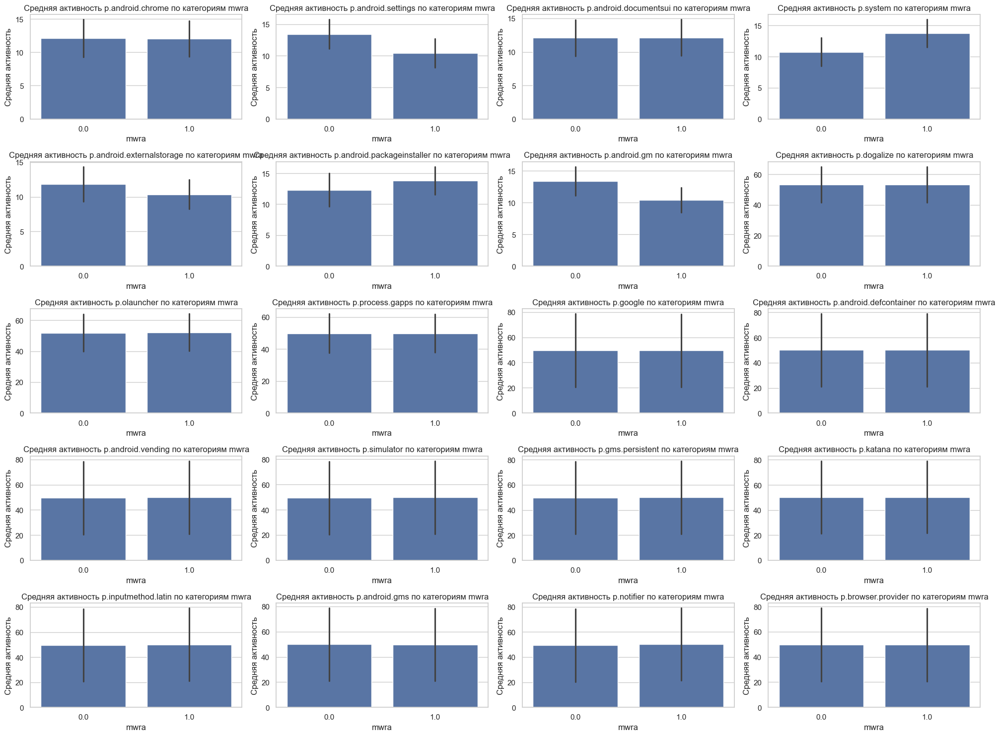

In [18]:
def analyze_processes(df):
    apps = [
        'p.android.chrome', 'p.android.settings', 'p.android.documentsui',
        'p.system', 'p.android.externalstorage', 'p.android.packageinstaller',
        'p.android.gm', 'p.dogalize', 'p.olauncher', 'p.process.gapps',
        'p.google', 'p.android.defcontainer', 'p.android.vending',
        'p.simulator', 'p.gms.persistent', 'p.katana', 'p.inputmethod.latin',
        'p.android.gms', 'p.notifier', 'p.browser.provider'
    ]

    # 1. Гистограммы
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        plt.subplot(5, 4, i)  # Увеличил количество строк и колонок
        sns.histplot(df[app], bins=10, kde=True, color='skyblue')
        plt.title(f'Распределение активности {app}')
        plt.xlabel('Значение')
        plt.ylabel('Частота')
    plt.tight_layout()
    plt.show()

    # 2. Гистограммы по категориям mwra
    for app in apps:
        plt.figure(figsize=(8, 6))
        sns.histplot(
            data=df, x=app, hue='mwra', bins=10, kde=True, palette='Set1', multiple='stack'
        )
        plt.title(f'Распределение {app} по категориям mwra')
        plt.xlabel('Значение')
        plt.ylabel('Частота')

        # Убедитесь, что легенда отображается
        handles, labels = plt.gca().get_legend_handles_labels()
        if handles:
            plt.legend(title='mwra')
        plt.show()

    # 3. Коробчатые диаграммы
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        plt.subplot(5, 4, i)
        sns.boxplot(
            x='mwra', y=app, hue='mwra', data=df, palette='Set2', dodge=False
        )
        plt.title(f'Распределение {app} по категориям mwra')
        plt.xlabel('mwra')
        plt.ylabel('Активность')
        plt.legend([], [], frameon=False)  # Убираем легенду для чистоты графика
    plt.tight_layout()
    plt.show()

    # 4. Столбчатые графики подсчета
    plt.figure(figsize=(8, 6))
    sns.countplot(x='mwra', data=df)
    plt.title('Количество записей по категориям mwra')
    plt.xlabel('mwra')
    plt.ylabel('Количество записей')
    plt.show()


    # 6. Столбчатые графики сравнения
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        plt.subplot(5, 4, i)
        sns.barplot(x='mwra', y=app, data=df, errorbar='sd')  # Заменяем ci на errorbar
        plt.title(f'Средняя активность {app} по категориям mwra')
        plt.xlabel('mwra')
        plt.ylabel('Средняя активность')
    plt.tight_layout()
    plt.show()

analyze_processes(df_proc)


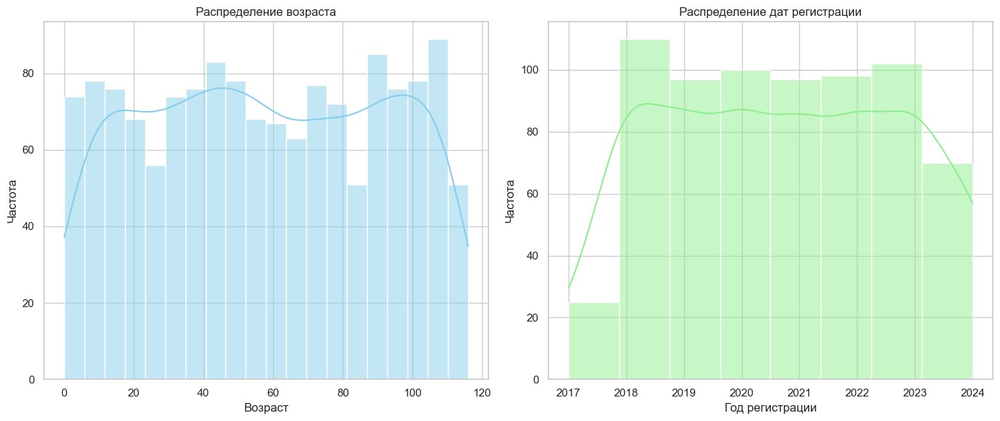

In [19]:
def analyze_profiles(df):
      # Преобразуем даты в формат datetime
    df['registration'] = pd.to_datetime(df['registration'], errors='coerce')
    df['birthdate'] = pd.to_datetime(df['birthdate'], errors='coerce')

    # Вычисляем возраст
    df['age'] = (datetime.datetime.now() - df['birthdate']).dt.days // 365

    # 1. Гистограммы для возраста и даты регистрации
    plt.figure(figsize=(14, 6))

    # Гистограмма для возраста
    plt.subplot(1, 2, 1)
    sns.histplot(df['age'], bins=20, kde=True, color='skyblue')
    plt.title('Распределение возраста')
    plt.xlabel('Возраст')
    plt.ylabel('Частота')

    # Гистограмма для даты регистрации
    plt.subplot(1, 2, 2)
    sns.histplot(df['registration'].dt.year, bins=df['registration'].dt.year.nunique(), kde=True, color='lightgreen')
    plt.title('Распределение дат регистрации')
    plt.xlabel('Год регистрации')
    plt.ylabel('Частота')

    plt.tight_layout()
    plt.show()
analyze_profiles(df_prof)

1.1 C:

In [20]:
def C1b(x):
    name, df = list(datasets.items())[x]
    print(f'Pairing Analysis for "{name}" dataset')

    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_columns = [col for col in numeric_columns if 'imei' not in col]

    if numeric_columns:
        corr_matrix = df[numeric_columns].corr()
        if len(numeric_columns) > 1:
            plt.figure(figsize=(25, 18))
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
            plt.title(f'Pearson Correlation Heatmap for {name}')
            plt.savefig(f'../plots/C/pearson_heat_map_{name}.png')
            plt.show()
    else:
        print(f"No numeric columns to analyze for {name}")

Pairing Analysis for "Connections" dataset


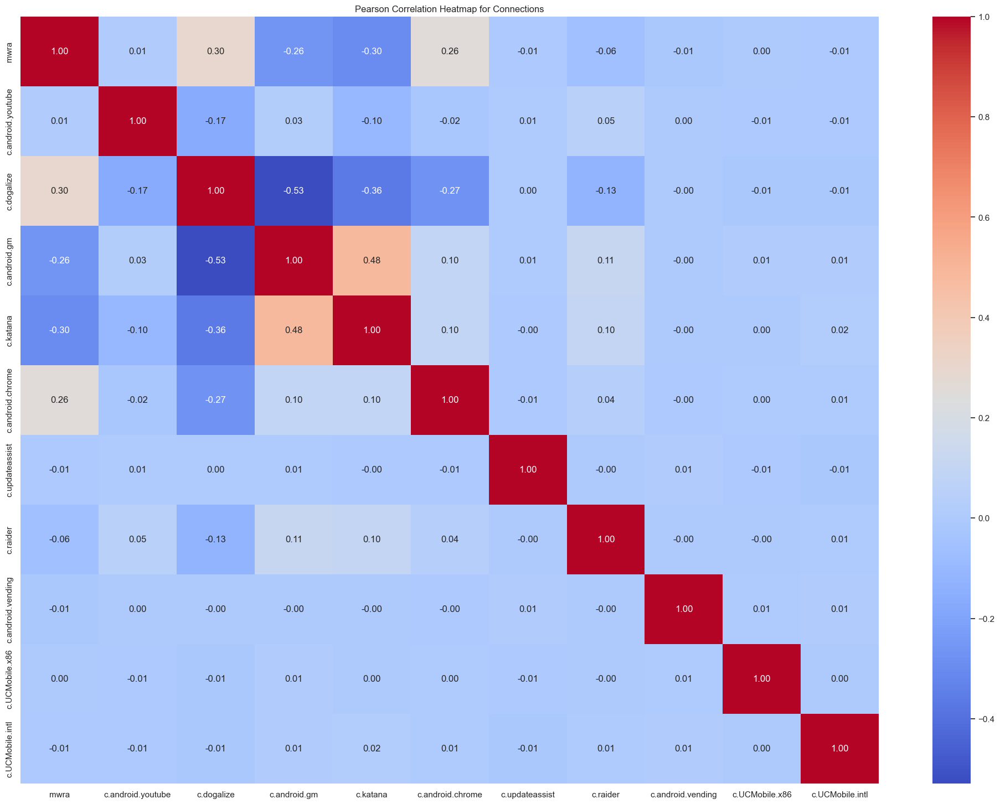

In [21]:
C1b(0)

Pairing Analysis for "Devices" dataset


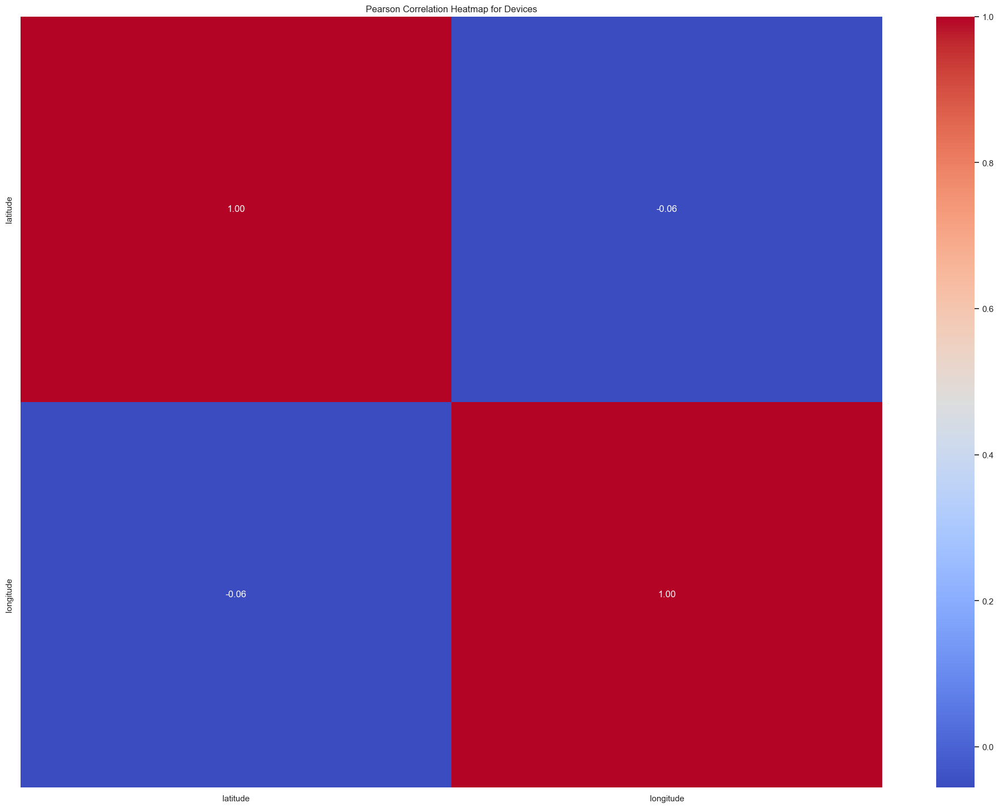

In [22]:
C1b(1)

Pairing Analysis for "Processes" dataset


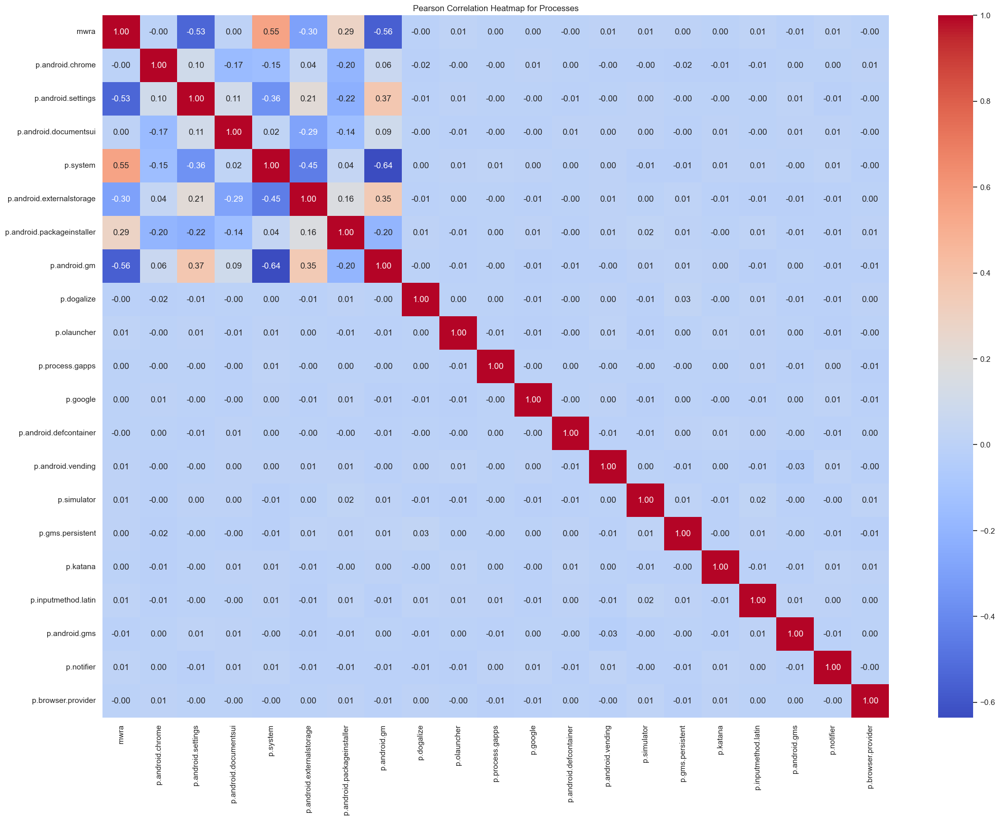

In [23]:
C1b(2)

Pairing Analysis for "Profiles" dataset


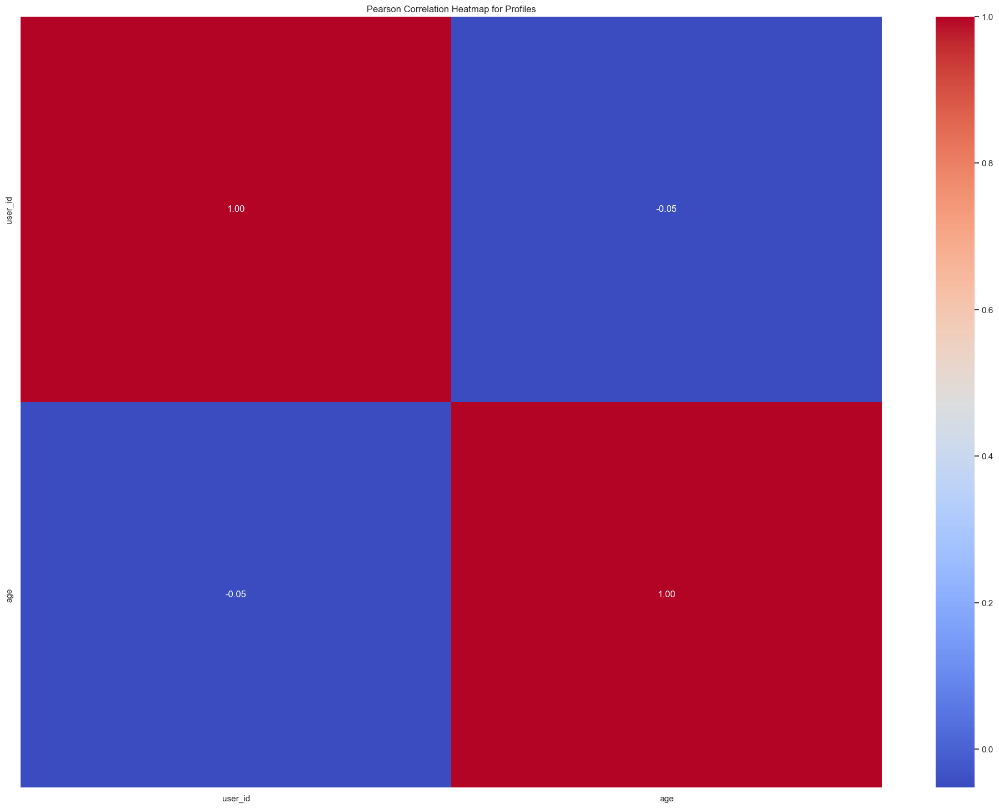

In [24]:
C1b(3)

1.1 D:

Корреляция с mwra:
mwra                 1.000000
c.dogalize           0.297159
c.android.chrome     0.256803
c.android.youtube    0.010822
c.UCMobile.x86       0.001940
c.UCMobile.intl     -0.007424
c.updateassist      -0.008046
c.android.vending   -0.010325
c.raider            -0.058482
c.android.gm        -0.264992
c.katana            -0.300643
Name: mwra, dtype: float64


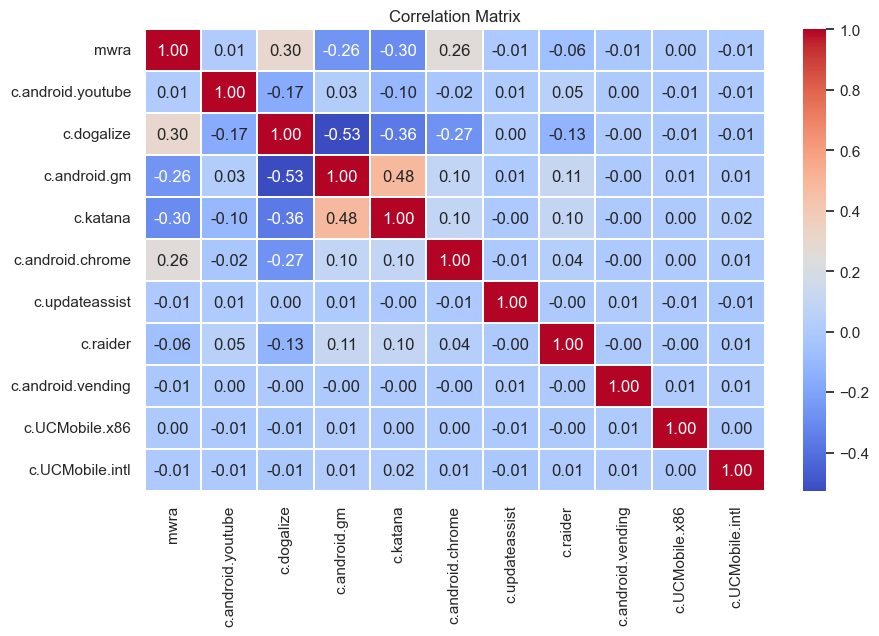

In [25]:
def D_conn(df):
    #Correlation between mwra & predictions
    df_numeric = df.select_dtypes(include=['float'])
    corr_matrix = df_numeric.corr()
    
    mwra_corr = corr_matrix['mwra'].sort_values(ascending=False)
    print("Корреляция с mwra:")
    print(mwra_corr)
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.2, fmt='.2f')
    plt.title("Correlation Matrix")
    plt.show()
D_conn(df_conn)

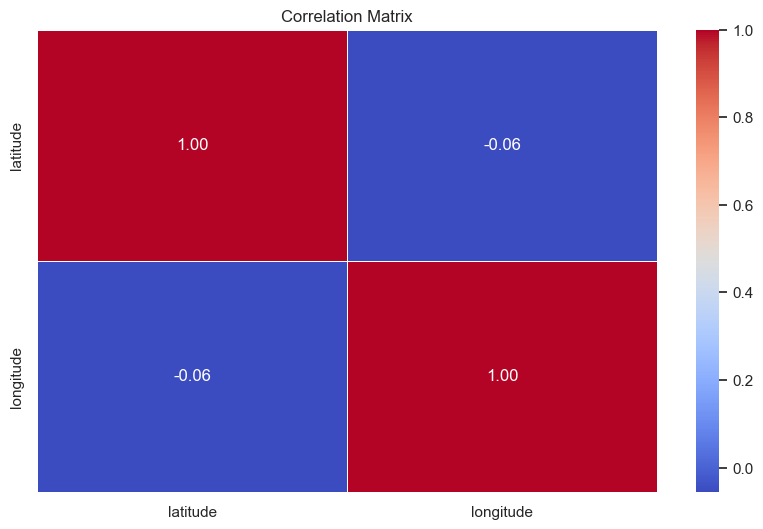

In [26]:
def D_dev(df):
    df_numeric = df.select_dtypes(include=['float'])
    possible_columns = ['region_', 'location', 'store_name']
    numeric_columns = [col for col in possible_columns if col in df.columns and df[col].dtype in ['float64', 'int64']]
    
    df_numeric = df_numeric.join(df[numeric_columns])
    corr_matrix = df_numeric.corr()

    
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5,fmt='.2f')
    plt.title("Correlation Matrix")
    plt.show()
D_dev(df_dev)

Корреляция с mwra:
mwra                          1.000000
p.system                      0.546412
p.android.packageinstaller    0.287509
p.notifier                    0.013381
p.inputmethod.latin           0.011044
p.olauncher                   0.009763
p.android.vending             0.006643
p.simulator                   0.006161
p.gms.persistent              0.004058
p.android.documentsui         0.003163
p.google                      0.001144
p.process.gapps               0.000557
p.katana                      0.000194
p.android.defcontainer       -0.000210
imei                         -0.000512
p.browser.provider           -0.000553
p.android.chrome             -0.001738
p.dogalize                   -0.004594
p.android.gms                -0.005287
p.android.externalstorage    -0.295212
p.android.settings           -0.534300
p.android.gm                 -0.564367
Name: mwra, dtype: float64


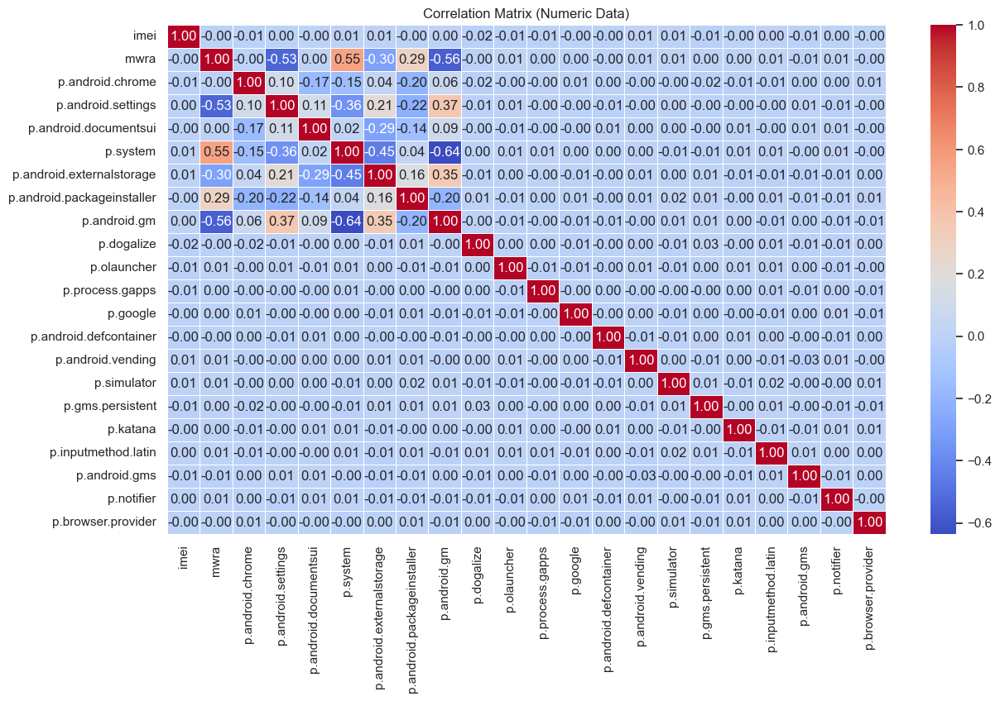

In [27]:
def D_proc(df):
    df_numeric = df.select_dtypes(include=['float', 'int'])
    corr_matrix = df_numeric.corr()

    mwra_corr = corr_matrix['mwra'].sort_values(ascending=False)
    print("Корреляция с mwra:")
    print(mwra_corr)
    
    plt.figure(figsize=(14, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
    plt.title("Correlation Matrix (Numeric Data)")
    plt.show()
D_proc(df_proc)

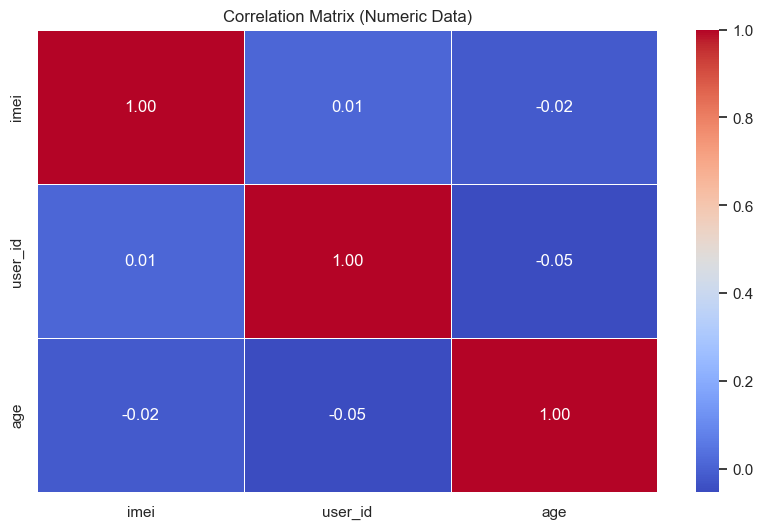

In [28]:
def D_prof(df):
    df_numeric = df.select_dtypes(include=['float', 'int'])
    corr_matrix = df_numeric.corr()
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
    plt.title("Correlation Matrix (Numeric Data)")
    plt.show()
D_prof(df_prof)   

1.1 E:
Написать итоги

Identifikácia problémov, integrácia a čistenie dát

1.2 A:

In [29]:

def reformat_file(file_path):
      # Шаг 1: Чтение TSV файла с правильным разделителем
    try:
        df = pd.read_csv(file_path, sep='\t', on_bad_lines='warn', engine='python')
    except Exception as e:
        print(f"Ошибка при чтении файла: {e}")
        return

    # Шаг 2: Заполнение отсутствующих значений NaN
    df.fillna(value=np.nan, inplace=True)

    # Шаг 3: Определение ширины колонок на основе максимальной длины содержимого и заголовка
    column_widths = [max(df[col].astype(str).map(len).max(), len(col)) for col in df.columns]

    # Шаг 4: Перезапись файла с выравниванием колонок
    try:
        with open(file_path, 'w', encoding='utf-8') as outfile:
            # Форматирование заголовков с выравниванием
            formatted_header = "\t".join(header.ljust(column_widths[i]) for i, header in enumerate(df.columns))
            outfile.write(formatted_header + '\n')

            # Форматирование строк данных с выравниванием
            for index, row in df.iterrows():
                formatted_row = "\t".join(str(val).ljust(column_widths[i]) for i, val in enumerate(row))
                outfile.write(formatted_row + '\n')

        print("Файл успешно отформатирован.")
    except Exception as e:
        print(f"Ошибка при записи файла: {e}")


def save_df(df, output_file):
    df.to_csv(output_file, sep='\t', index=False)
def clean_data_Nan(df,method):
    if method == 1:
        cleaned_df = df.dropna()
        print(f"Delete: {len(df) - len(cleaned_df)}")
    elif method == 2:
        for column in df.columns:
            if df[column].isnull().any():
                 if pd.api.types.is_numeric_dtype(df[column]):
                        replacement_value = df[column].mean()
                        df[column] = df[column].fillna(replacement_value)
                        print(f"Value in '{column}' replaced with: {replacement_value}")
                 else:
                        print(f"Column '{column}' is not numeric and will not be filled with mean value.")
        cleaned_df = df
    else:
        print("Eror: Method not recognize")
        return None
    
    return cleaned_df
def remove_outliers_zscore(df, threshold=3):
    df_cleaned = df.copy()
    
    for column in df_cleaned.select_dtypes(include=[np.number]).columns:
        z_scores = (df_cleaned[column] - df_cleaned[column].mean()) / df_cleaned[column].std()
        df_cleaned = df_cleaned[(np.abs(z_scores) < threshold)]
    
    return df_cleaned
def remove_outliers_iqr(df):
    df_cleaned = df.copy()
    
    for column in df_cleaned.select_dtypes(include=[np.number]).columns:
        Q1 = df_cleaned[column].quantile(0.25)
        Q3 = df_cleaned[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Вычисляем 5% и 95% границы
        lower_limit = df_cleaned[column].quantile(0.05)
        upper_limit = df_cleaned[column].quantile(0.95)
        
        # Заменяем выбросы на границы распределения
        df_cleaned[column] = np.where(df_cleaned[column] < lower_bound, lower_limit, df_cleaned[column])
        df_cleaned[column] = np.where(df_cleaned[column] > upper_bound, upper_limit, df_cleaned[column])
    
    return df_cleaned
def check_format(file_path, x):
    expected_columns = {
        'Profiles': [
            'registration', 'birthdate', 'current_location', 'company', 'ssn',
            'residence', 'imei', 'user_id', 'name', 'username', 'mail', 'job'
        ],
        'Connections': [
            'ts', 'imei', 'mwra', 'c.android.youtube', 'c.dogalize', 'c.android.gm',
            'c.katana', 'c.android.chrome', 'c.updateassist', 'c.raider',
            'c.android.vending', 'c.UCMobile.x86', 'c.UCMobile.intl'
        ],
        'Devices': [
            'latitude', 'longitude', 'store_name', 'code', 'location', 'imei'
        ],
        'Processes': [
            'ts', 'imei', 'mwra', 'p.android.chrome', 'p.android.settings',
            'p.android.documentsui', 'p.system', 'p.android.externalstorage',
            'p.android.packageinstaller', 'p.android.gm', 'p.dogalize',
            'p.olauncher', 'p.process.gapps', 'p.google', 'p.android.defcontainer',
            'p.android.vending', 'p.simulator', 'p.gms.persistent', 'p.katana',
            'p.inputmethod.latin', 'p.android.gms', 'p.notifier', 'p.browser.provider'
        ]
    }
    format_checks = {
        'Profiles': [
            r'^\d{4}-\d{2}-\d{2}$',          # registration (YYYY-MM-DD)
            r'^\d{4}-\d{2}-\d{2}$',          # birthdate (YYYY-MM-DD)
            r'^\(Decimal\(\'\d+\.\d+\'), Decimal\(\'-\d+\.\d+\'\)$',  # current_location
            r'^[A-Za-z, ]+$',                # company
            r'^\d{3}-\d{2}-\d{4}$',          # ssn
            r'^[A-Za-z0-9, ]*$',              # residence
            r'^\d{16}$',                     # imei
            r'^\d+$',                        # user_id
            r'^[A-Za-z ]+$',                # name
            r'^[A-Za-z0-9]+$',              # username
            r'^[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}$',  # mail
            r'^[A-Za-z]+$'                  # job
        ],
        'Devices': [
            r'^\d+\.\d+$',                  # latitude
            r'^\-\d+\.\d+$',                # longitude
            r'^[A-Za-z ]+$',                # store_name
            r'^[A-Z]{2}$',                  # code (двухбуквенный код)
            r'^[A-Za-z/]+$'                 # location
        ],
        'Connections': [
            r'^\d+$',                        # ts
            r'^\d{16}$',                     # imei
            r'^\d+\.\d+$',                  # mwra
            r'^\d+\.\d+$',                  # c.android.youtube
            r'^\d+\.\d+$',                  # c.dogalize
            r'^\d+\.\d+$',                  # c.android.gm
            r'^\d+\.\d+$',                  # c.katana
            r'^\d+\.\d+$',                  # c.android.chrome
            r'^\d+\.\d+$',                  # c.updateassist
            r'^\d+\.\d+$',                  # c.raider
            r'^\d+\.\d+$',                  # c.android.vending
            r'^\d+\.\d+$',                  # c.UCMobile.x86
            r'^\d+\.\d+$'                   # c.UCMobile.intl
        ],
        'Processes': [
            r'^\d+$',                        # ts
            r'^\d{16}$',                     # imei
            r'^\d+\.\d+$',                  # mwra
            r'^\d+\.\d+$',                  # p.android.chrome
            r'^\d+\.\d+$',                  # p.android.settings
            r'^\d+\.\d+$',                  # p.android.documentsui
            r'^\d+\.\d+$',                  # p.system
            r'^\d+\.\d+$',                  # p.android.externalstorage
            r'^\d+\.\d+$',                  # p.android.packageinstaller
            r'^\d+\.\d+$',                  # p.android.gm
            r'^\d+\.\d+$',                  # p.dogalize
            r'^\d+\.\d+$',                  # p.olauncher
            r'^\d+\.\d+$',                  # p.process.gapps
            r'^\d+\.\d+$',                  # p.google
            r'^\d+\.\d+$',                  # p.android.defcontainer
            r'^\d+\.\d+$',                  # p.android.vending
            r'^\d+\.\d+$',                  # p.simulator
            r'^\d+\.\d+$',                  # p.gms.persistent
            r'^\d+\.\d+$',                  # p.katana
            r'^\d+\.\d+$',                  # p.inputmethod.latin
            r'^\d+\.\d+$',                  # p.android.gms
            r'^\d+\.\d+$',                  # p.notifier
            r'^\d+\.\d+$'                   # p.browser.provider
        ]
    }

    file_name, df_buff = list(datasets.items())[x]

    try:
        # Читаем файл в DataFrame
        df = pd.read_csv(file_path)

        # Проверяем соответствие заголовков
        if file_name in expected_columns:
            if list(df.columns) != expected_columns[file_name]:
                return  # Прекращаем выполнение, если заголовки не совпадают
            
            # Проверяем формат данных и удаляем строки с неправильным форматом
            for index, row in df.iterrows():
                for col_index, column in enumerate(expected_columns[file_name]):
                    if not re.match(format_checks[file_name][col_index], str(row[column])):
                        print(f"Неверный формат в строке {index + 1}, колонке '{column}': {row[column]}")
                        df.drop(index, inplace=True)  # Удаляем строку с неправильным форматом
                        break  # Прекращаем проверку для этой строки
            
            # Сохраняем изменения обратно в файл
            df.to_csv(file_path, index=False)
    
    except Exception as e:
        print(f"Ошибка при проверке формата файла: {e}")

def A2b(x):
    name, df = list(datasets.items())[x]

    if name in ["Connections", "Processes"]:  
        # Преобразование с указанием формата
        df['ts'] = pd.to_datetime(df['ts'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

        # Преобразование в Unix timestamp
        df['ts'] = (df['ts'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')
    elif name == "Devices":
        le = LabelEncoder()
        for column in df.select_dtypes(include=['object']).columns:
            df[column] = le.fit_transform(df[column])
    elif name == "Profiles":
        def convert_dates(date_str):
            try:
                # First, try to convert the date string to datetime
                dt = pd.to_datetime(date_str, errors='coerce')
                if pd.isna(dt):
                    print(f"Invalid date format for input: {date_str}")
                return dt
            except Exception as e:
                print(f"Error processing date: {e}")
                return pd.NaT 

        # Apply the conversion to registration and birthdate
        df['registration'] = df['registration'].apply(convert_dates)
        df['birthdate'] = df['birthdate'].apply(convert_dates)
        
        # Drop rows with NaT in registration or birthdate
        df = df.dropna(subset=['registration', 'birthdate'])
        
        # Convert to timestamp (in seconds) only for valid dates
        df['registration'] = df['registration'].apply(lambda x: int(x.timestamp()) if pd.notna(x) else None)
        df['birthdate'] = df['birthdate'].apply(lambda x: int(x.timestamp()) if pd.notna(x) else None)

        def convert_location(location_str):
            if not isinstance(location_str, str):
                return None 

            try:
                lat_str, lon_str = location_str.strip("()").split(", ")
                lat = float(lat_str.split("'")[1]) 
                lon = float(lon_str.split("'")[1])
                return lat + lon 
            except Exception as e:
                print(f"Error processing location: {e}")
    
        # Применяем функцию и убираем строки с None в столбце current_location
        df.loc[:, 'current_location'] = df['current_location'].apply(convert_location)
        df = df.dropna(subset=['current_location'])
        
 
            # Преобразуем все текстовые столбцы в числовые
        text_columns = df.select_dtypes(include=['object']).columns
        for col in text_columns:
            le = LabelEncoder()
            df[col] = df[col].astype(str)  # Преобразуем в строку, если это необходимо
            df[col] = le.fit_transform(df[col])  # Преобразуем текстовые данные в числовые

    else:
        print(f"Dataset '{name}' not recognized for processing.")
        
    return df



In [30]:
check_format('../024/connections.csv',0)

# Convert all values to float
processed_df_conn = A2b(0)
save_df(processed_df_conn, '../datasets/024-ver1/connections.csv')
save_df(processed_df_conn, '../datasets/024-ver2/connections.csv')

# Clean all NaN values
clean_data1 = clean_data_Nan(processed_df_conn, 1)
clean_data2 = clean_data_Nan(processed_df_conn, 2)

# Drop duplicates
clean_data1 = clean_data1.drop_duplicates()
clean_data2 = clean_data2.drop_duplicates()

# Drop outliers
clean_data1 = remove_outliers_zscore(clean_data1)
clean_data2 = remove_outliers_iqr(clean_data2)

# Save cleaned data
save_df(clean_data1, '../datasets/024-ver1/connections.csv')
save_df(clean_data2, '../datasets/024-ver2/connections.csv')


Delete: 0


In [31]:
check_format('../024/devices.csv',1)

# Process the devices dataset
processed_df_dev = A2b(1)
save_df(processed_df_dev, '../datasets/024-ver1/devices.csv')
save_df(processed_df_dev, '../datasets/024-ver2/devices.csv')

# Clean all NaN values
clean_data1_dev = clean_data_Nan(processed_df_dev, 1)
clean_data2_dev = clean_data_Nan(processed_df_dev, 2)

# Drop duplicates
clean_data1_dev = clean_data1_dev.drop_duplicates()
clean_data2_dev = clean_data2_dev.drop_duplicates()

# Drop outliers
clean_data1_dev = remove_outliers_zscore(clean_data1_dev)
clean_data2_dev = remove_outliers_iqr(clean_data2_dev)

# Save cleaned data
save_df(clean_data1_dev, '../datasets/024-ver1/devices.csv')
save_df(clean_data2_dev, '../datasets/024-ver2/devices.csv')



Delete: 0


In [32]:
check_format('../024/processes.csv',2)

# Process the processes dataset
processed_df_proc = A2b(2)
save_df(processed_df_proc, '../datasets/024-ver1/processes.csv')
save_df(processed_df_proc, '../datasets/024-ver2/processes.csv')

# Clean all NaN values
clean_data1_proc = clean_data_Nan(processed_df_proc, 1)
clean_data2_proc = clean_data_Nan(processed_df_proc, 2)

# Drop duplicates
clean_data1_proc = clean_data1_proc.drop_duplicates()
clean_data2_proc = clean_data2_proc.drop_duplicates()

# Drop outliers
clean_data1_proc = remove_outliers_zscore(clean_data1_proc)
clean_data2_proc = remove_outliers_iqr(clean_data2_proc)

# Save cleaned data
save_df(clean_data1_proc, '../datasets/024-ver1/processes.csv')
save_df(clean_data2_proc, '../datasets/024-ver2/processes.csv')


Delete: 0


In [33]:
# check_format('../024/profiles.csv',3)

# Process the profiles dataset
processed_df_prof = A2b(3)
save_df(processed_df_prof, '../datasets/024-ver1/profiles.csv')
save_df(processed_df_prof, '../datasets/024-ver2/profiles.csv')

# Clean all NaN values
clean_data1_prof = clean_data_Nan(processed_df_prof, 1)
clean_data2_prof = clean_data_Nan(processed_df_prof, 2)

# Drop duplicates
clean_data1_prof = clean_data1_prof.drop_duplicates()
clean_data2_prof = clean_data2_prof.drop_duplicates()
 
# Drop outliers
clean_data1_prof = remove_outliers_zscore(clean_data1_prof)
clean_data2_prof = remove_outliers_iqr(clean_data2_prof)

# Save cleaned data
save_df(clean_data1_prof, '../datasets/024-ver1/profiles.csv')
save_df(clean_data2_prof, '../datasets/024-ver2/profiles.csv')


Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format for input: NaT
Invalid date format 

/var/folders/5z/646fhd_x0vz_f_b50b5kmsgm0000gn/T/ipykernel_93535/2382104265.py:225: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['registration'] = df['registration'].apply(lambda x: int(x.timestamp()) if pd.notna(x) else None)
/var/folders/5z/646fhd_x0vz_f_b50b5kmsgm0000gn/T/ipykernel_93535/2382104265.py:226: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['birthdate'] = df['birthdate'].apply(lambda x: int(x.timestamp()) if pd.notna(x) else None)


Lets analzye data again:

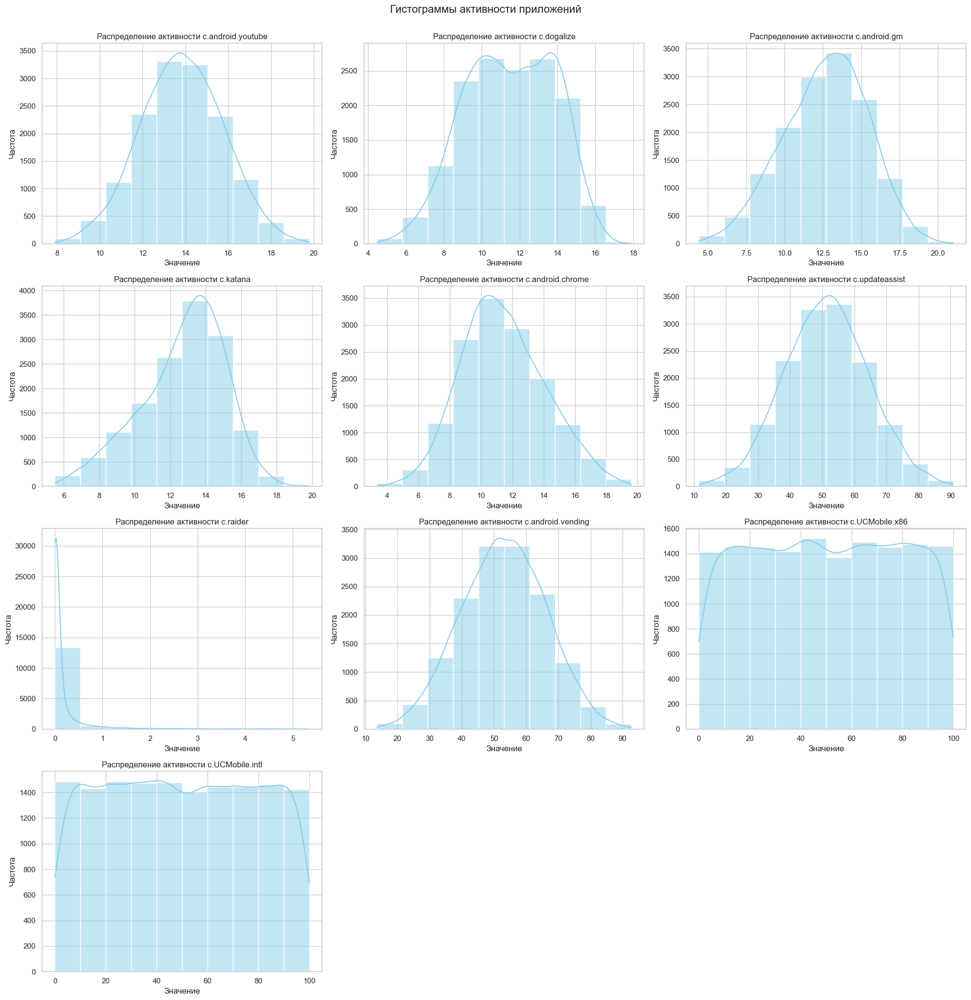

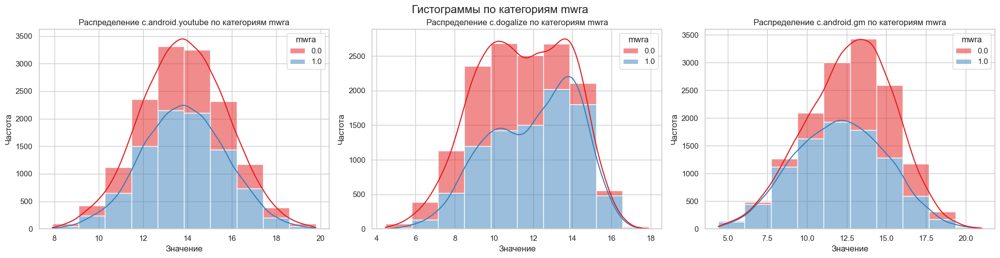

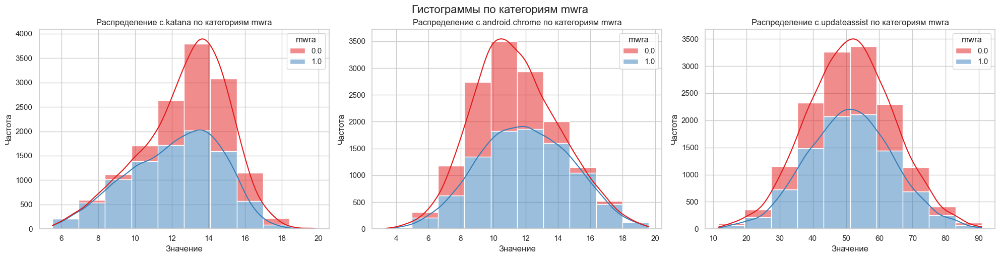

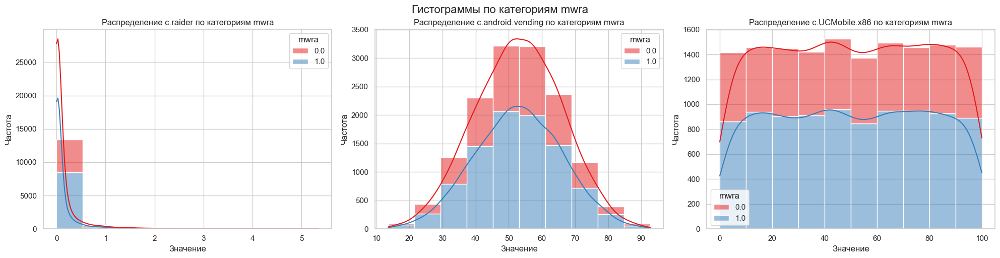

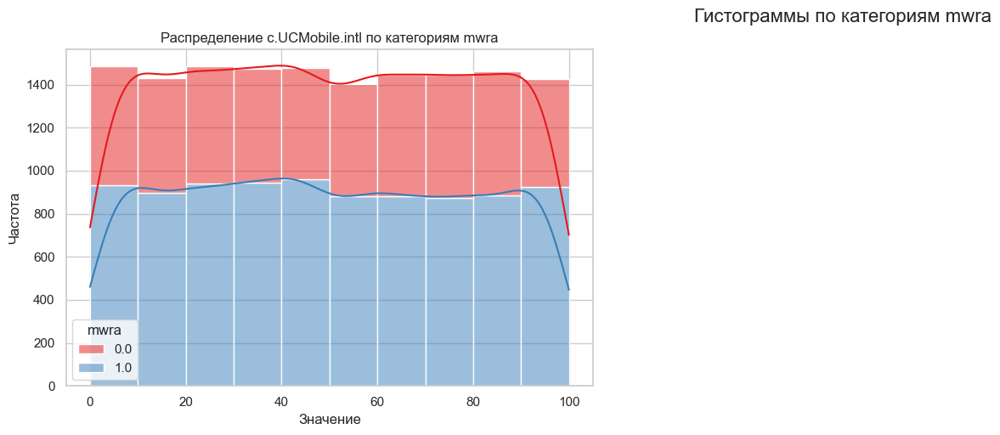

...

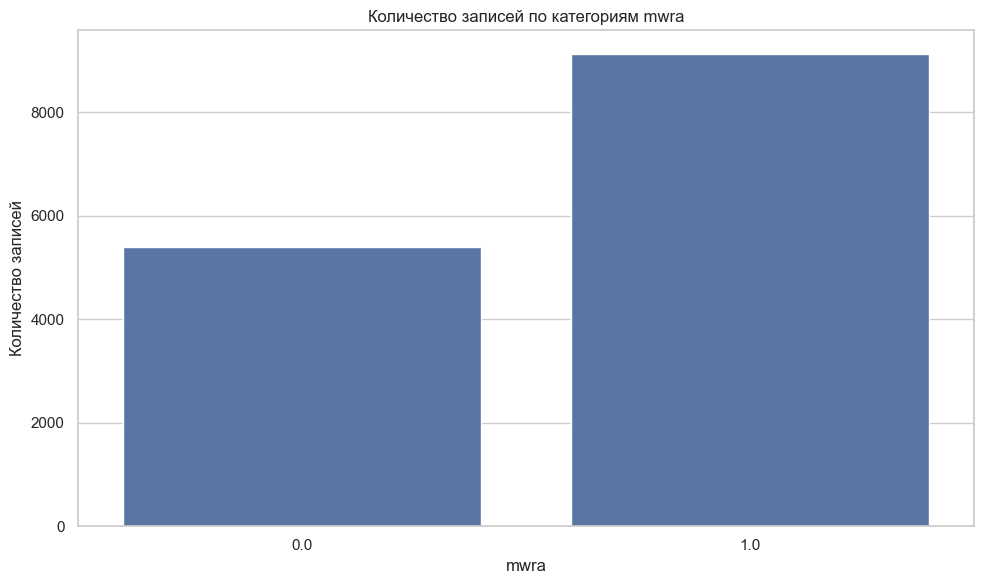

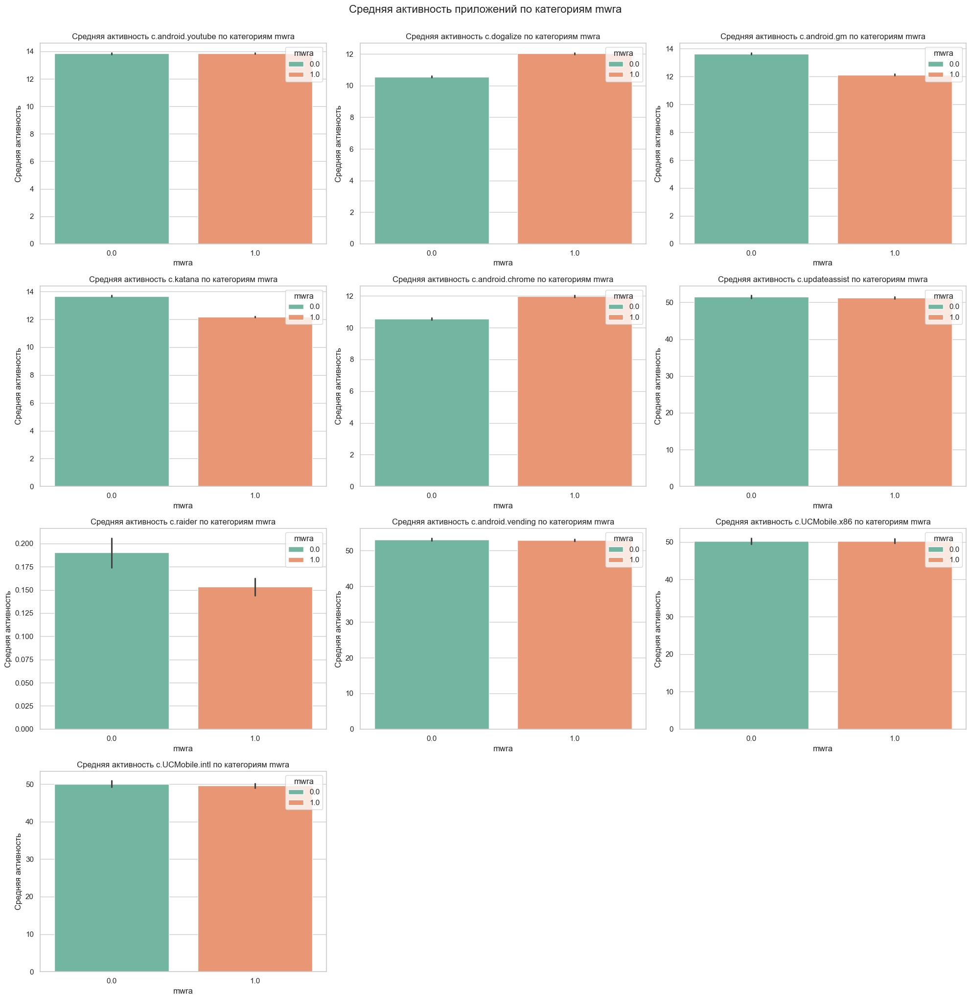

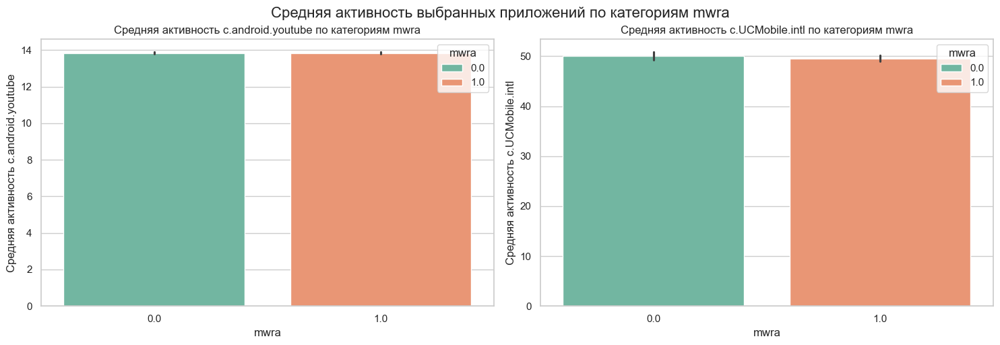

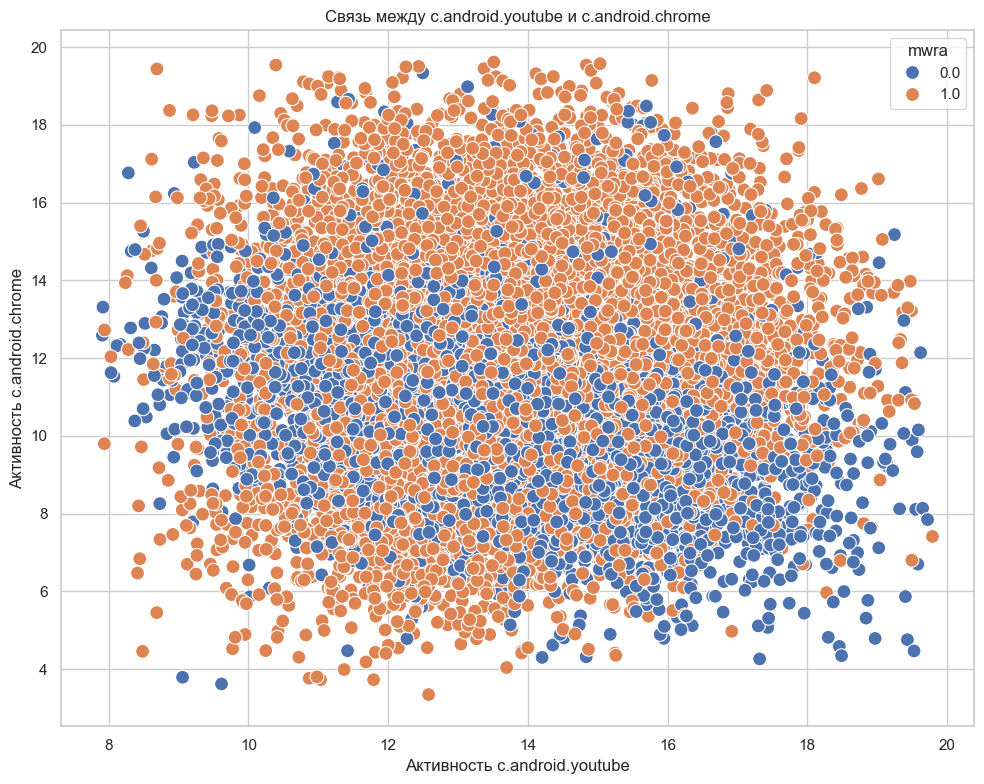

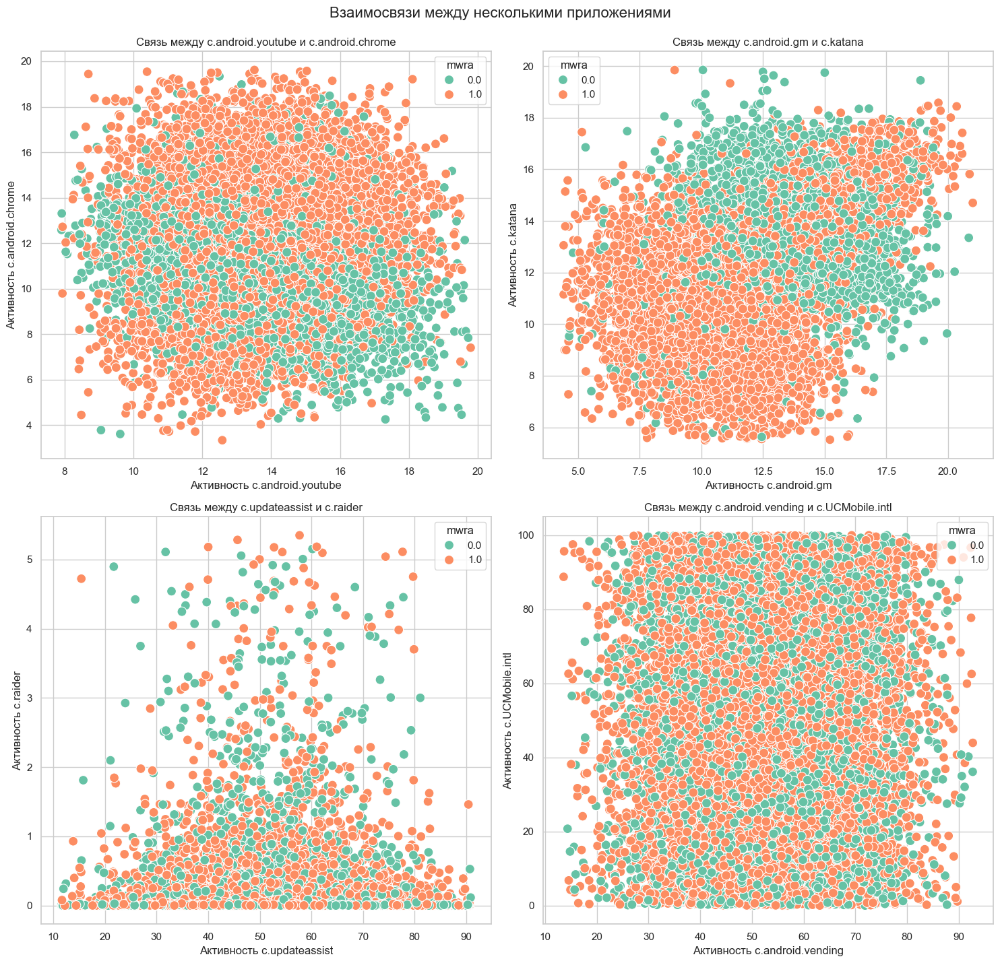

In [34]:
new_df_conn = pd.read_csv('../datasets/024-ver1/connections.csv', sep='\t')
new_df_dev = pd.read_csv('../datasets/024-ver1/devices.csv', sep='\t')
new_df_proc = pd.read_csv('../datasets/024-ver1/processes.csv', sep='\t')
new_df_prof = pd.read_csv('../datasets/024-ver1/profiles.csv', sep='\t')

analyze_connections(new_df_conn)

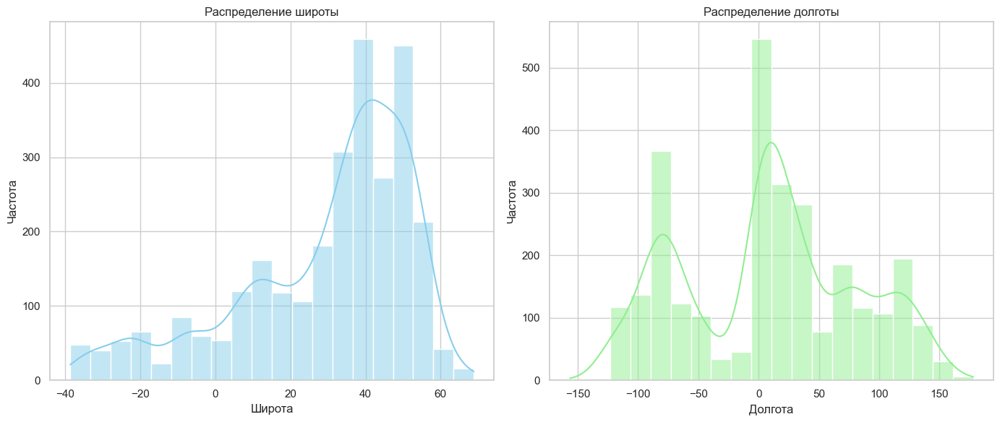

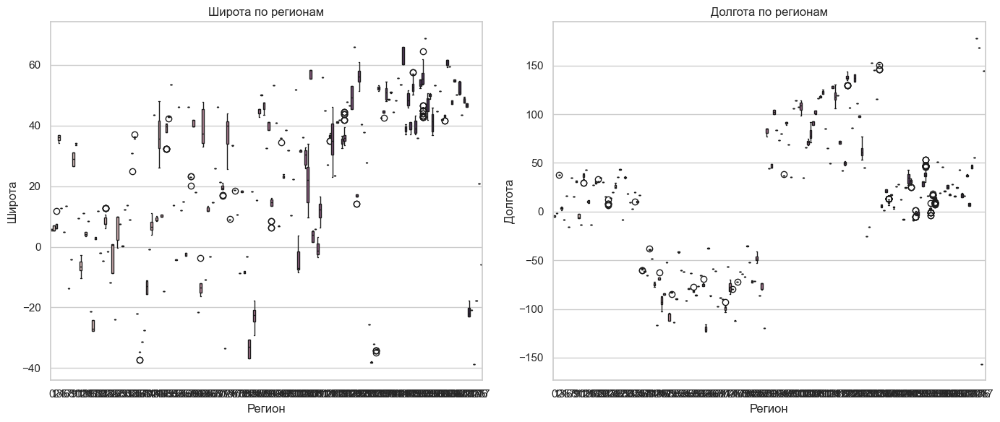

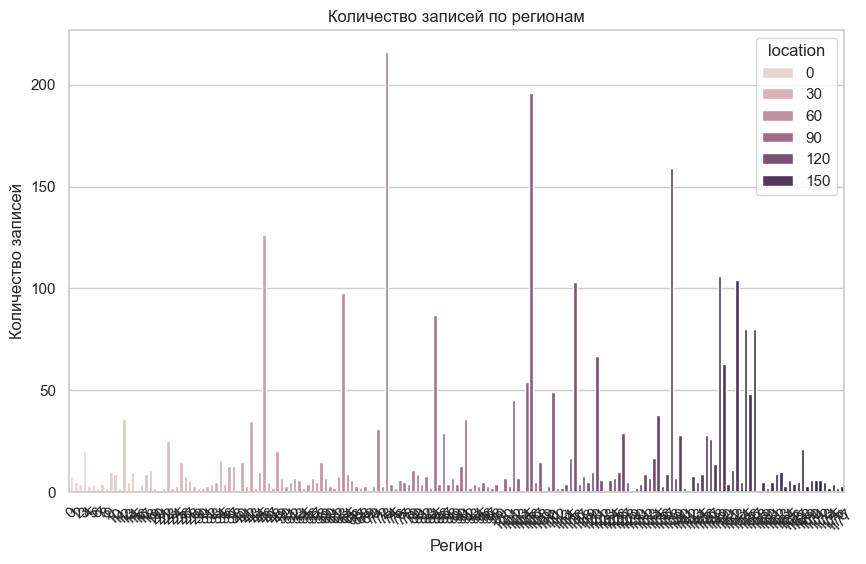

In [35]:
analyze_devices(new_df_dev)


In [ ]:
analyze_processes(new_df_proc)

In [ ]:
analyze_profiles(new_df_prof)